<a href="#1.1.-Дополнительные-пакеты">  - 1.1. Дополнительные пакеты</a>

<!--TABLE OF CONTENTS-->
<b>Contents:</b>
- [1. Телеком — задача проекта](#1.-Телеком-—-задача-проекта)
  - [1.1. Дополнительные пакеты](#1.1.-Дополнительные-пакеты)
  - [1.2. Импорты](#1.2.-Импорты)
  - [1.3. Загрузка данных](#1.3.-Загрузка-данных)
  - [1.4. Анализ данных](#1.4.-Анализ-данных)
    - [1.4.1. Код клиента CustomerID](#1.4.1.-Код-клиента-CustomerID)
    - [1.4.2. Предобработка данных для EDA](#1.4.2.-Предобработка-данных-для-EDA)
      - [1.4.2.1. Приведение типов данных](#1.4.2.1.-Приведение-типов-данных)
      - [1.4.2.2. Добавление признаков для EDA](#1.4.2.2.-Добавление-признаков-для-EDA)
    - [1.4.3. EDA sweetviz + ydata profiling](#1.4.3.-EDA-sweetviz-+-ydata-profiling)
    - [1.4.4. Обработка пропусков и аномалий](#1.4.4.-Обработка-пропусков-и-аномалий)
    - [1.4.5.  Выбросы, диаграммы размаха](#1.4.5.--Выбросы,-диаграммы-размаха)
    - [1.4.6. Выводы](#1.4.6.-Выводы)
  - [1.5. Вопросы](#1.5.-Вопросы)
  - [1.6. План работы](#1.6.-План-работы)
  - [1.7. Feature selection](#1.7.-Feature-selection)
    - [1.7.1. Утечка целевого признака](#1.7.1.-Утечка-целевого-признака)
    - [1.7.2. Незначимые признаки](#1.7.2.-Незначимые-признаки)
    - [1.7.3. Сильно коррелирующие признаки](#1.7.3.-Сильно-коррелирующие-признаки)
  - [1.8. Pipeline](#1.8.-Pipeline)
    - [1.8.1. Кастомные классы и функции](#1.8.1.-Кастомные-классы-и-функции)
    - [1.8.2. Сборка пайплайна](#1.8.2.-Сборка-пайплайна)
      - [1.8.2.1. Feature extraction](#1.8.2.1.-Feature-extraction)
      - [1.8.2.2. Обработка категориальных признаков](#1.8.2.2.-Обработка-категориальных-признаков)
      - [1.8.2.3. Обработка численных признаков](#1.8.2.3.-Обработка-численных-признаков)
      - [1.8.2.4. ColumnTransformer](#1.8.2.4.-ColumnTransformer)
  - [1.9. Обучение моделей](#1.9.-Обучение-моделей)
    - [1.9.1. Проверка модели на адекватность](#1.9.1.-Проверка-модели-на-адекватность)
    - [1.9.2. Catboost](#1.9.2.-Catboost)
    - [1.9.3. Logistic Regression](#1.9.3.-Logistic-Regression)
    - [1.9.4. RandomForestClassifier](#1.9.4.-RandomForestClassifier)
  - [1.10. Тестирование и анализ лучшей модели](#1.10.-Тестирование-и-анализ-лучшей-модели)
    - [1.10.1. Feature importance](#1.10.1.-Feature-importance)
    - [1.10.2. ROC кривые и матрицы ошибок](#1.10.2.-ROC-кривые-и-матрицы-ошибок)
    - [1.10.3. Выводы](#1.10.3.-Выводы)
- [2. Отчет](#2.-Отчет)
  - [2.1. План](#2.1.-План)
  - [2.2. Ключевые шаги](#2.2.-Ключевые-шаги)
  - [2.3. Выводы, анализ результатов тестирования](#2.3.-Выводы,-анализ-результатов-тестирования)

# 1. Телеком — задача проекта

Построить модель оттока клиентов телеком-оператора. Информация о договорах актуальна на 1 февраля 2020.

<b>Описание полей данных</b>

* customerID - код клиента
* BeginDate - дата начала пользования услугами
* EndDate - дата окончания пользования услугами
* Type - период оплаты: раз месяц или раз в год/два года
* PaperlessBilling - получение электронного чека вместо бумажного
* PaymentMethod - тип платежа (электронная квитанция/квитанция на e-mail/автоматический платеж через банк)
* MonthlyCharges - ежемесячные траты на услуги
* TotalCharges - всего потрачено денег на услуги
* gender - пол абонента
* SeniorCitizen - пенсионер
* Partner - наличие супруга(и)
* Dependents - наличие иждивенцев
* InternetService - подключена ли услуга интернета
* OnlineSecurity - подключена ли услуга блокировки небезопасных сайтов
* OnlineBackup - подключена ли услуга "Облачное хранилище файлов для резервного копирования данных"
* DeviceProtection - подключена ли услуга антивируса
* TechSupport - подключена ли услуга "Выделенная линия технической поддержки"
* StreamingTV - подключена ли услуга "Стриминговое телевидение"
* StreamingMovies подключена ли услуга "Каталог фильмов"
* MultipleLines - несколько линий стационарной тел. связи

## 1.1. Дополнительные пакеты


Сначала импортируем время, чтобы посчитать длительность выполнения вместе с установкой всех пакетов:

In [1]:
import time
tic = time.perf_counter()

In [2]:
!pip install ydata-profiling[notebook] --quiet

In [3]:
!pip install sweetviz --quiet

In [4]:
!pip install matplotlib_venn --quiet

Более свежая версия seaborn нужна чтобы работал hue на stripplot-графике (на 0.11.1 - не работает, не раскрашивает по exit-признаку).

In [5]:
!pip install seaborn==0.12.2 --quiet

In [6]:
!pip install feature-engine --quiet

In [7]:
!pip install scikit-learn==1.2.2 --quiet

In [8]:
!pip install catboost==1.1.1 --quiet

In [9]:
!pip install optuna --quiet

## 1.2. Импорты


In [10]:
try:
    %load_ext jupyter_black
except:
    print("Can`t load black")

In [11]:
import warnings
import numpy as np
import pandas as pd
import re

import matplotlib.pyplot as plt
from matplotlib_venn import venn2, venn3
import seaborn as sns

import sweetviz as sv
from ydata_profiling import ProfileReport
from statsmodels.tsa.seasonal import seasonal_decompose

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector
from feature_engine.selection import DropFeatures
from feature_engine.imputation import CategoricalImputer, ArbitraryNumberImputer
from sklearn.model_selection import cross_val_score, StratifiedKFold, train_test_split
from sklearn.preprocessing import (
    OrdinalEncoder,
    OneHotEncoder,
    StandardScaler,
    PowerTransformer,
)

from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier

import optuna
from optuna.integration import OptunaSearchCV

from sklearn.metrics import (
    roc_auc_score,
    f1_score,
    precision_score,
    recall_score,
    RocCurveDisplay,
    ConfusionMatrixDisplay,
)

## 1.3. Загрузка данных


In [12]:
DATA_PATH = "/datasets/final_provider/"

In [13]:
contracts = pd.read_csv(f"{DATA_PATH}contract.csv")
personal = pd.read_csv(f"{DATA_PATH}personal.csv")
internet = pd.read_csv(f"{DATA_PATH}internet.csv")
phone = pd.read_csv(f"{DATA_PATH}phone.csv")

In [14]:
data_collection = {
    "Contracts": contracts,
    "Personal": personal,
    "Internet": internet,
    "Phone": phone,
}.items()

## 1.4. Анализ данных


Выведем первые десять строк для всех таблиц:

In [15]:
for label, data in data_collection:
    print(label, "- first 10 rows")
    display(data.head(10))
    print()

Contracts - first 10 rows


,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.5
2,3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75
4,9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65
5,9305-CDSKC,2019-03-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,99.65,820.5
6,1452-KIOVK,2018-04-01,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.4
7,6713-OKOMC,2019-04-01,No,Month-to-month,No,Mailed check,29.75,301.9
8,7892-POOKP,2017-07-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,104.80,3046.05
9,6388-TABGU,2014-12-01,No,One year,No,Bank transfer (automatic),56.15,3487.95



Personal - first 10 rows


,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No
5,9305-CDSKC,Female,0,No,No
6,1452-KIOVK,Male,0,No,Yes
7,6713-OKOMC,Female,0,No,No
8,7892-POOKP,Female,0,Yes,No
9,6388-TABGU,Male,0,No,Yes



Internet - first 10 rows


,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,Fiber optic,No,No,No,No,No,No
5,9305-CDSKC,Fiber optic,No,No,Yes,No,Yes,Yes
6,1452-KIOVK,Fiber optic,No,Yes,No,No,Yes,No
7,6713-OKOMC,DSL,Yes,No,No,No,No,No
8,7892-POOKP,Fiber optic,No,No,Yes,Yes,Yes,Yes
9,6388-TABGU,DSL,Yes,Yes,No,No,No,No



Phone - first 10 rows


,customerID,MultipleLines
0,5575-GNVDE,No
1,3668-QPYBK,No
2,9237-HQITU,No
3,9305-CDSKC,Yes
4,1452-KIOVK,Yes
5,7892-POOKP,Yes
6,6388-TABGU,No
7,9763-GRSKD,No
8,7469-LKBCI,No
9,8091-TTVAX,Yes


Посмоhим на типы данных в таблицах и число записей в них:

In [16]:
for label, data in data_collection:
    print(label)
    data.info()
    print()

Contracts
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB

Personal
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-

В таблицах contract и personal одинаковое число записей, а в internet и phone - меньше. Это, скорее всего, показатель того, что есть пользователи без подключенной услуги интернета, а также пользователи без подключенной услуги стационарной телефонной связи.

Явных пропусков в таблицах нет, но т.к. большинство полей типа object, то в значениях могут содержаться пустые строки или другие несоотвествующие полю строковые литералы.

### 1.4.1. Код клиента CustomerID


Проверим что нет записей с пустыми идентификаторами:

In [17]:
for label, data in data_collection:
    print(
        f"Empty customerID's count in {label}:",
        (data.customerID.str.strip() == "").sum(),
    )

Empty customerID's count in Contracts: 0
Empty customerID's count in Personal: 0
Empty customerID's count in Internet: 0
Empty customerID's count in Phone: 0


А также проверим что в таблицах нет записей с дублирующимися идентификаторами:

In [18]:
for label, data in data_collection:
    print(
        f"Duplicated customerID's count in {label}:",
        data.duplicated().sum(),
    )

Duplicated customerID's count in Contracts: 0
Duplicated customerID's count in Personal: 0
Duplicated customerID's count in Internet: 0
Duplicated customerID's count in Phone: 0


Таким образом, можно объединить таблицы, предварительно проверив как пересекаются множества идентификаторов в разных таблицах:

In [19]:
ids_in_data = [set(data["customerID"]) for _, data in data_collection]

Проверим, что множества идентификаторов клиента в таблицах Contracts и Personal одинаковы:

In [20]:
ids_in_data[0] == ids_in_data[1]

True

Также убедимся, что множества идентификаторов клиента в таблицах Internet и Phones при объединении дадут множество всех клиентов (таблицы Contract/Personal):

In [21]:
ids_in_data[0] == (ids_in_data[2].union(ids_in_data[3]))

True

Для данных по интернет-услуге и телефонии построим диаграмму Венна:

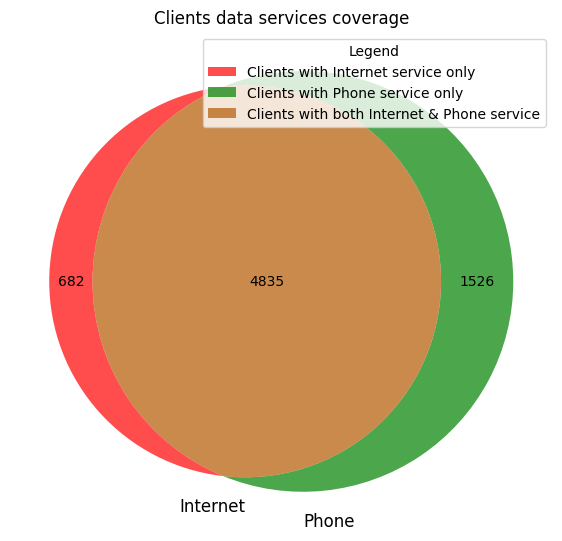

In [22]:
plt.figure(figsize=(7, 7))
ax = plt.gca()
fig = venn2(
    ids_in_data[2:4],
    [label for label, _ in data_collection][2:4],
    alpha=0.7,
)

l = [
    "Clients with Internet service only",
    "Clients with Phone service only",
    "Clients with both Internet & Phone service",
]
ax.legend(labels=l, title="Legend", loc="upper right")
plt.title("Clients data services coverage")

plt.show()

Как видим, больше всего клиентов, у которых подключены услуги и телефонии и интернета (4835), далее клиенты только с телефонией (1526), и меньше всего клиентов с один лишь интернетом (628).

А также посмотрим на множество ушедших на диаграмме Венна по услугам:

In [23]:
ids_exited = set(contracts.query('EndDate!="No"')["customerID"])

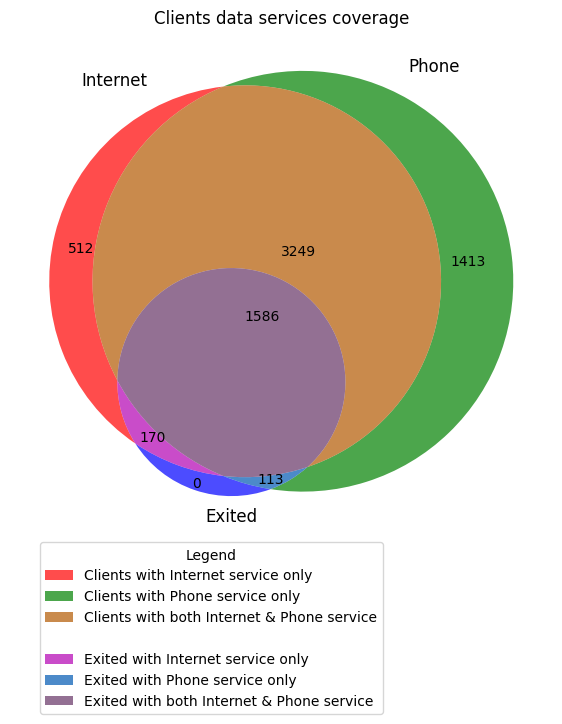

In [24]:
plt.figure(figsize=(7, 7))
ax = plt.gca()
fig = venn3(
    ids_in_data[2:4] + [ids_exited],
    [label for label, _ in data_collection][2:4] + ["Exited"],
    alpha=0.7,
)

l = [
    "Clients with Internet service only",
    "Clients with Phone service only",
    "Clients with both Internet & Phone service",
    "",
    "Exited with Internet service only",
    "Exited with Phone service only",
    "Exited with both Internet & Phone service",
]

legend = ax.legend(labels=l, title="Legend", bbox_to_anchor=(0.7, 0))

legend.legendHandles[3].set_visible(False)
plt.title("Clients data services coverage")

plt.show()

Видим, что больше всего клиентов ушло будучи подключенными к обеим услугам (1586 против 3249 оставшихся), клиентов подключенных только к интернету ушло 170 к 512 оставшимся, а из клиентов подключенных только к телефонии ушло меньше всего - 113 к 1413

### 1.4.2. Предобработка данных для EDA


Объединим данные в один датафрейм:

In [25]:
data = (
    contracts.merge(personal, on="customerID")
    .merge(internet, how="left", on="customerID")
    .merge(phone, how="left", on="customerID")
)

In [26]:
data.head()

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,NaN
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.5,Male,0,No,No,DSL,Yes,No,Yes,No,No,No,No
2,3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75,Male,0,No,No,DSL,Yes,No,Yes,Yes,No,No,NaN
4,9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,No,No,Fiber optic,No,No,No,No,No,No,No


Приведем названия колонок к snake_case:

In [27]:
data.columns = [
    re.sub(r"(?<!^)(?<![A-Z])(?=[A-Z])", "_", column_name).lower()
    for column_name in data.columns
]

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   begin_date         7043 non-null   object 
 2   end_date           7043 non-null   object 
 3   type               7043 non-null   object 
 4   paperless_billing  7043 non-null   object 
 5   payment_method     7043 non-null   object 
 6   monthly_charges    7043 non-null   float64
 7   total_charges      7043 non-null   object 
 8   gender             7043 non-null   object 
 9   senior_citizen     7043 non-null   int64  
 10  partner            7043 non-null   object 
 11  dependents         7043 non-null   object 
 12  internet_service   5517 non-null   object 
 13  online_security    5517 non-null   object 
 14  online_backup      5517 non-null   object 
 15  device_protection  5517 non-null   object 
 16  tech_support       5517 

#### 1.4.2.1. Приведение типов данных


Преобразуем даты с помощью pd.to_datetime:

In [29]:
data["begin_date"] = pd.to_datetime(data["begin_date"], infer_datetime_format=True)
data.loc[data["end_date"] == "No", ["end_date"]] = pd.NA
data["end_date"] = pd.to_datetime(data["end_date"], infer_datetime_format=True)

Преобразуем gender и признаки-индикаторы наличия услуг к типу boolean:

In [30]:
data["is_male"] = data["gender"] == "Male"
data = data.drop(columns=["gender"])

In [31]:
for column in [
    "paperless_billing",
    "partner",
    "dependents",
    "online_security",
    "online_backup",
    "device_protection",
    "tech_support",
    "streaming_tv",
    "streaming_movies",
    # "multiple_lines", #сначала надо извлечь из него признак наличия услуги телефонии
]:
    data[column] = data[column].apply(
        lambda v: True if v == "Yes" else False
    )  # .astype('boolean')

data["senior_citizen"] = data["senior_citizen"].astype(bool)

Категориальные типы приведем к типу category:

In [32]:
for column in [
    "type",
    "payment_method",
    "internet_service",
]:
    data[column] = data[column].astype("category")

In [33]:
data.loc[
    ~data["total_charges"].map(lambda val: val.replace(".", "").isdigit()),
    ["total_charges"],
] = pd.NA
data["total_charges"] = pd.to_numeric(data["total_charges"])

Целевой признак получим на основе поля end_date (1, если оно не пустое):

In [34]:
data["exited"] = data["end_date"].notna().astype(int)

В итоге датафрейм выглядит следущим образом:

In [35]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           1869 non-null   datetime64[ns]
 3   type               7043 non-null   category      
 4   paperless_billing  7043 non-null   bool          
 5   payment_method     7043 non-null   category      
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7032 non-null   float64       
 8   senior_citizen     7043 non-null   bool          
 9   partner            7043 non-null   bool          
 10  dependents         7043 non-null   bool          
 11  internet_service   5517 non-null   category      
 12  online_security    7043 non-null   bool          
 13  online_backup      7043 non-null   bool          
 14  device_p

In [36]:
data.head()

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,senior_citizen,partner,...,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,is_male,exited
0,7590-VHVEG,2020-01-01,NaT,Month-to-month,True,Electronic check,29.85,29.85,False,True,...,DSL,False,True,False,False,False,False,NaN,False,0
1,5575-GNVDE,2017-04-01,NaT,One year,False,Mailed check,56.95,1889.50,False,False,...,DSL,True,False,True,False,False,False,No,True,0
2,3668-QPYBK,2019-10-01,2019-12-01,Month-to-month,True,Mailed check,53.85,108.15,False,False,...,DSL,True,True,False,False,False,False,No,True,1
3,7795-CFOCW,2016-05-01,NaT,One year,False,Bank transfer (automatic),42.30,1840.75,False,False,...,DSL,True,False,True,True,False,False,NaN,True,0
4,9237-HQITU,2019-09-01,2019-11-01,Month-to-month,True,Electronic check,70.70,151.65,False,False,...,Fiber optic,False,False,False,False,False,False,No,False,1


Запишем в переменную data_for_pipeline текущую копию даных, а data в дальнейшем будем использовать для анализа.

In [37]:
data_for_pipeline = data.copy()

#### 1.4.2.2. Добавление признаков для EDA


Добавим признаки-индикаторы наличия основных услуг:

In [38]:
data["has_phone"] = ~data["multiple_lines"].isna()
data["has_internet"] = ~data["internet_service"].isna()

Тогда можно заполнить пропуски в multiple_lines и преобразовать этот признак в boolean:

In [39]:
data["multiple_lines"] = data["multiple_lines"].apply(
    lambda v: True if v == "Yes" else False
)  # .astype('boolean')

Продолжительность договора с клиентом в месяцах:

In [40]:
data["contract_duration_months"] = (
    (
        (
            data["end_date"].map(
                lambda date: pd.to_datetime("2020-01-01") if pd.isnull(date) else date
            )
            - data["begin_date"]
        )
        / np.timedelta64(1, "M")
    )
    .round()
    .astype(int)
) + 1

In [41]:
data[data.contract_duration_months == 0]

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,senior_citizen,partner,...,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,is_male,exited,has_phone,has_internet,contract_duration_months
488,4472-LVYGI,2020-02-01,NaT,Two year,True,Bank transfer (automatic),52.55,NaN,False,True,...,True,True,True,False,False,False,0,False,True,0
753,3115-CZMZD,2020-02-01,NaT,Two year,False,Mailed check,20.25,NaN,False,False,...,False,False,False,False,False,True,0,True,False,0
936,5709-LVOEQ,2020-02-01,NaT,Two year,False,Mailed check,80.85,NaN,False,True,...,True,False,True,True,False,False,0,True,True,0
1082,4367-NUYAO,2020-02-01,NaT,Two year,False,Mailed check,25.75,NaN,False,True,...,False,False,False,False,True,True,0,True,False,0
1340,1371-DWPAZ,2020-02-01,NaT,Two year,False,Credit card (automatic),56.05,NaN,False,True,...,True,True,True,False,False,False,0,False,True,0
3331,7644-OMVMY,2020-02-01,NaT,Two year,False,Mailed check,19.85,NaN,False,True,...,False,False,False,False,False,True,0,True,False,0
3826,3213-VVOLG,2020-02-01,NaT,Two year,False,Mailed check,25.35,NaN,False,True,...,False,False,False,False,True,True,0,True,False,0
4380,2520-SGTTA,2020-02-01,NaT,Two year,False,Mailed check,20.00,NaN,False,True,...,False,False,False,False,False,False,0,True,False,0
5218,2923-ARZLG,2020-02-01,NaT,One year,True,Mailed check,19.70,NaN,False,True,...,False,False,False,False,False,True,0,True,False,0
6670,4075-WKNIU,2020-02-01,NaT,Two year,False,Mailed check,73.35,NaN,False,True,...,True,True,True,False,True,False,0,True,True,0


Долг/переплата:

In [42]:
data["charges_diff"] = (
    data["total_charges"] / data["contract_duration_months"] - data["monthly_charges"]
)

In [43]:
data["charges_ratio"] = (
    data["contract_duration_months"] * data["monthly_charges"] / data["total_charges"]
) - 1  # вычитаем 1 чтобы матожидание было в нуле

In [44]:
data["begin_month"] = data["begin_date"].dt.month

### 1.4.3. EDA sweetviz + ydata profiling


In [45]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore", FutureWarning)
    sv_report = sv.analyze(data, target_feat="exited")

                                             |                                              | [  0%]   00:00 -…


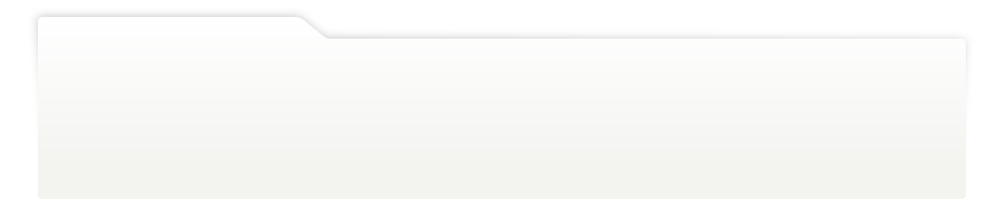
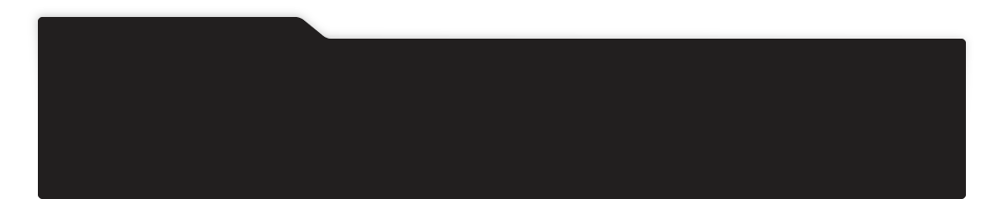
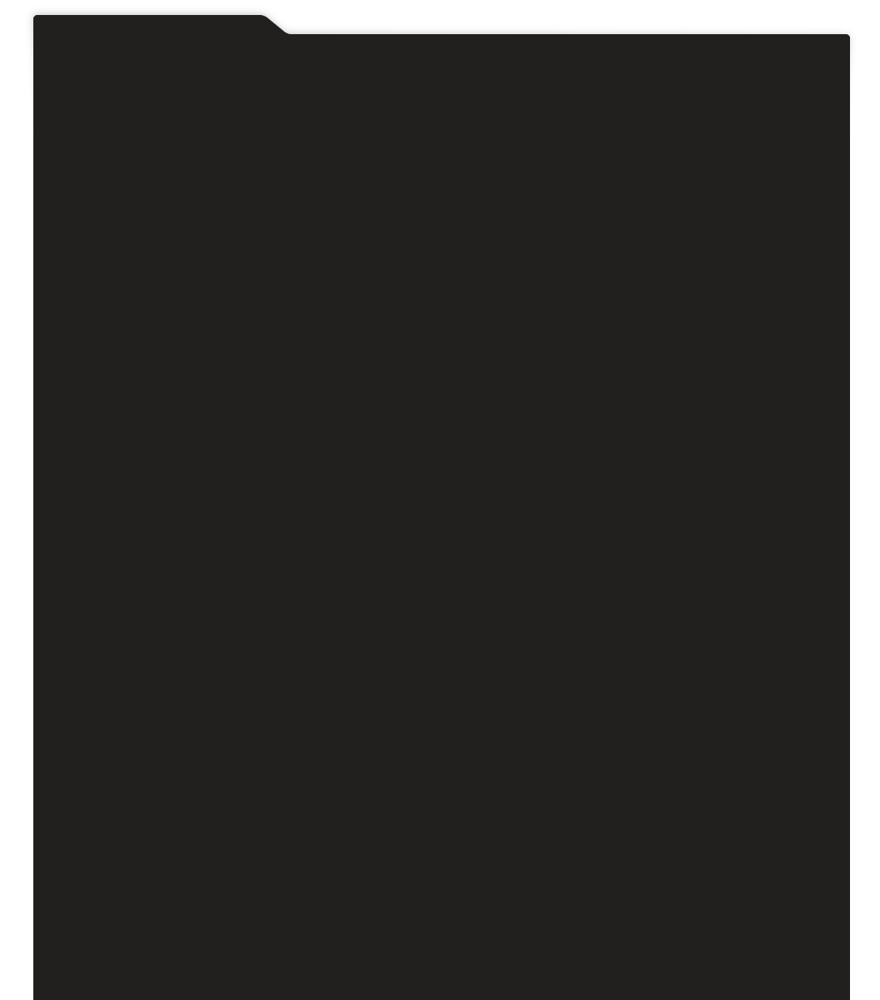
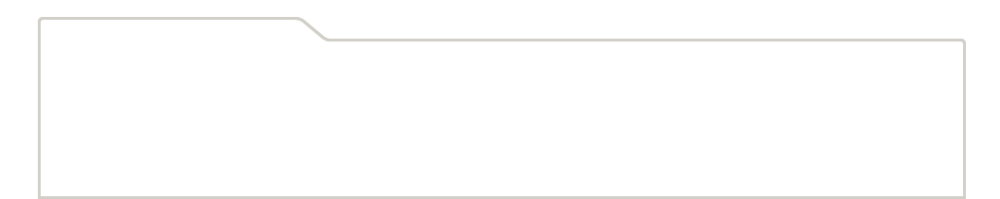
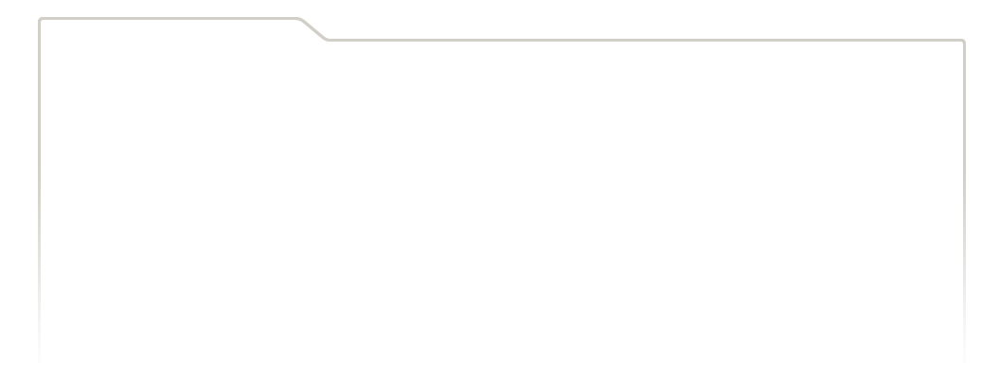
...
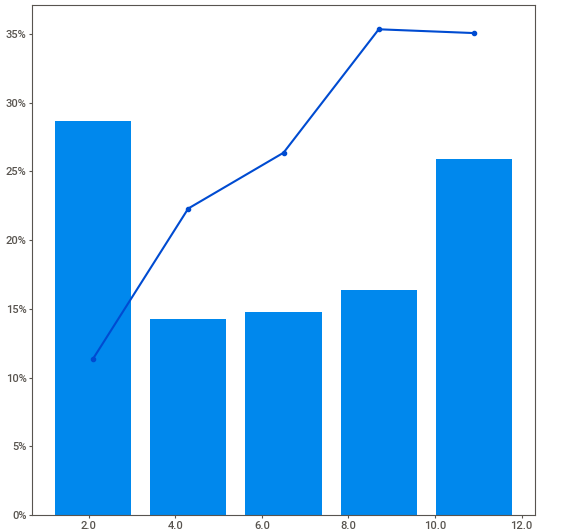
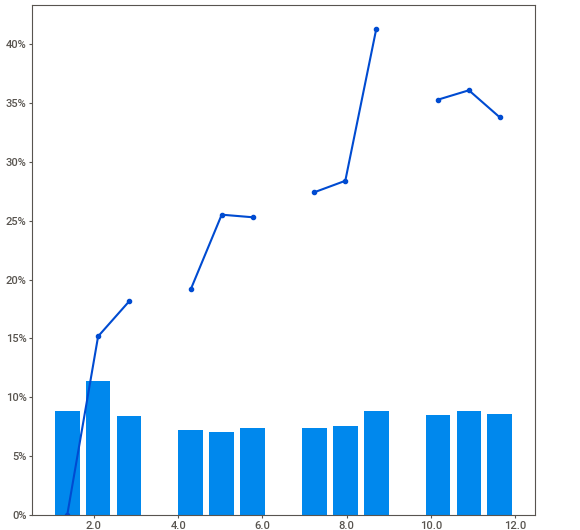
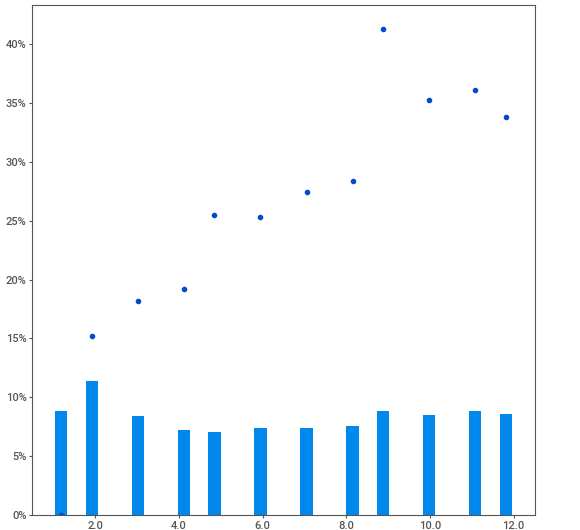
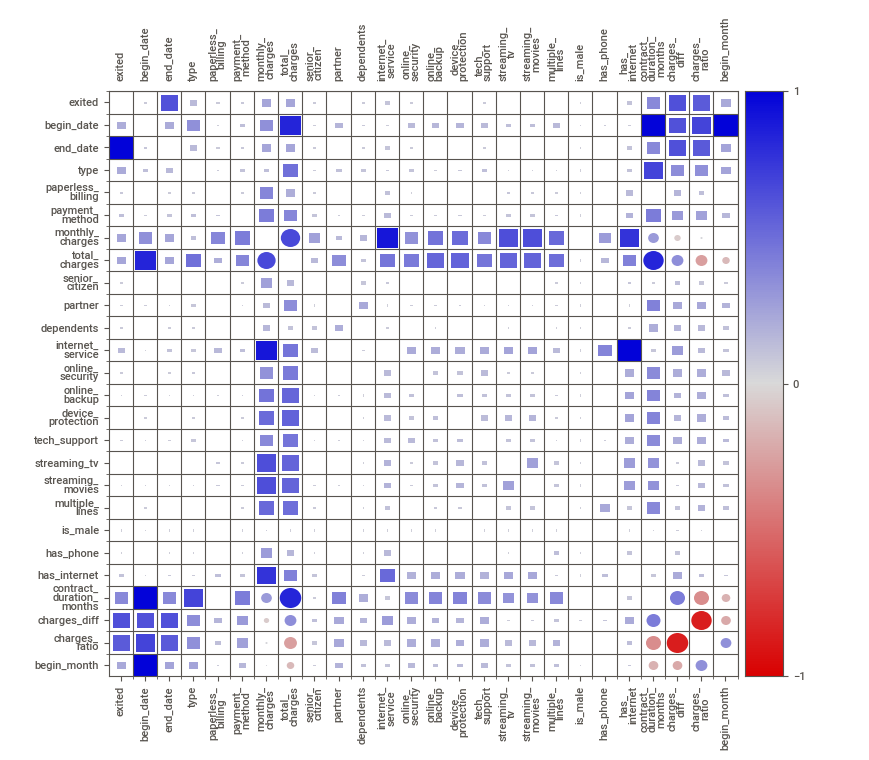
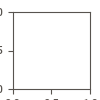

In [46]:
sv_report.show_notebook()

In [47]:
profile = ProfileReport(
    data,
    title="Profiling Report",
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "cramers": {"calculate": True},
        "phi_k": {"calculate": True},
    },
)

In [48]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Наблюдения по результатам полученных отчетов:

1. Есть дисбаланс классов: только ~27% клиентов в датасете расторгли договор
2. Есть данные о расторжении договоров только за 4 месяца с октября 2019 по январь 2020 включительно (только 4 уникальных значения для end_date)
3. Дата начала договора - с 2013-10-01 по 2020-02-01. Данные, где begin_date=='2020-02-01' следует скорее всего удалить, так как за этот месяц нет данных по ушедшим клиентам. Гистограмма имеет пик в начале (может быть, внесение в систему старых клиентов?) 
4. Чем больше период за который платит клиент, тем значительно меньше вероятность его ухода (снижается ~ в 4 раза при переходе от более короткого к более длительному периоду оплаты)
5. В два раза чаще уходят клиенты согласившиеся на получение электронных чеков, нежели те, кто до сих пор требует бумажный чек
6. Клиенты производящие оплату по электронной квитанции (electronic check) уходят более чем в 2 раза чаще, чем остальные клиенты (квитанция по почте, автоматический перевод, автоматическая оплата по карте).
7. В два раза чаще уходят те кто не имеет иждевенцев (dependents), а без супруги(а) - уходят в полтора раза чаще чем те, у кого они есть
8. Клиенты использующие следующие услуги уходили реже (в среднем почти в 2 раза) чем те клиенты, у которых они не подключены: 
    * интернет по оптоволокну
    * Интернет-безопасность
    * Выделенная линия технической поддержки
8. Клиенты-пенсионеры расторгают договор почти в 2 раза чаще, чем люди допенсионного возраста
9. Чем дольше клиент пользуется услугами провайдера, тем меньше вероятность его ухода, в свои первые 4 месяца уходит ~ половина клиентов
10. Клиенты пришедшие в начале года (в особенности январь - февраль) уходят реже, чем те кто стал клиентом в последней трети года (~ в 3 раза)
10. В основном уходят те у кого отрицательный баланс
11. Пол клиента практически не влияет на вероятность ухода
12. Есть небольшое число пропусков в total_charges
13. Есть много признаков с высокой корреляцией:
    * monthly_charges коррелирует с total_charges, internet_service, device_protection, streaming_tv, streaming_movies, multiple_lines, has phone, has_internet
    * total_charges еще с contract_duration_months, online_backup, device_protection, streaming_tv, streaming_movies
    * type коррелирует c contract_duration_months   
    * online_backup - с total_charges
    * streaming_tv - еще со streaming_movies
    * целевой признак exited коррелирует с нашим добавленным признаком charges_diff
    * кроме того коррелируют признаки, которые мы добавили для анализа, со своими источниками (перед обучением следует избавиться от этих зависимостей, оставив лишь одно поле или преобразовав их в комбинированный признак):
        * internet_service - c has_internet
        * contract_duration_months - c begin_date

Отдельно отрисуем heatmap с помощью phik:

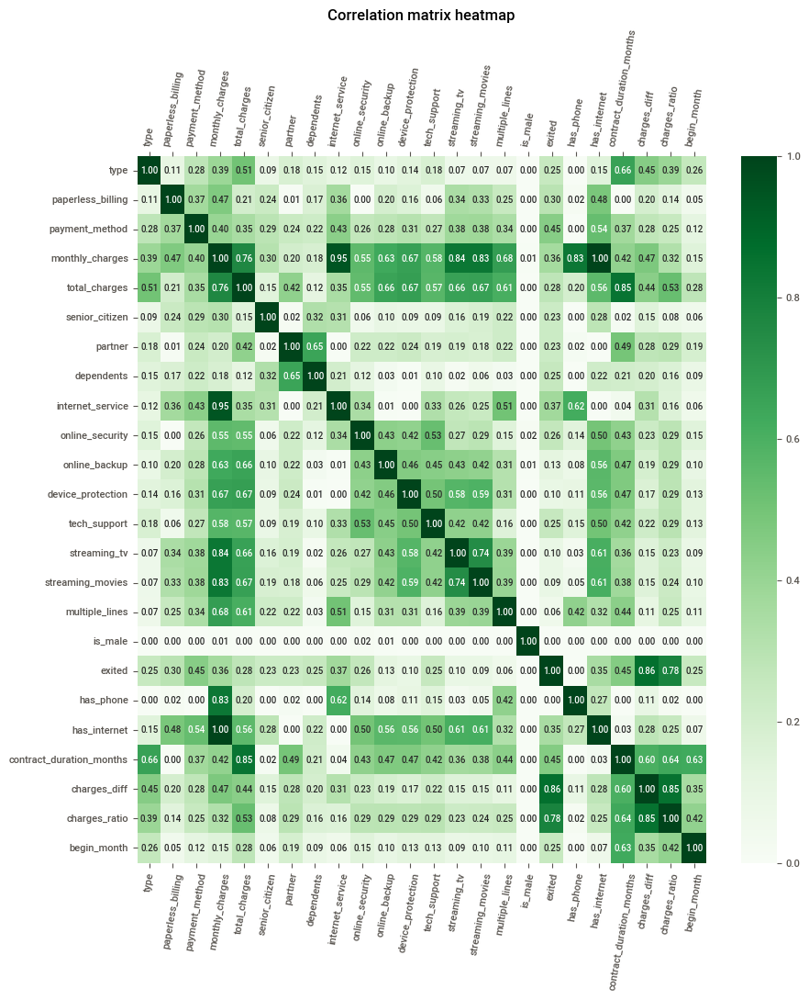

In [49]:
phik_corr = data.drop(columns=["customer_id", "begin_date", "end_date"]).phik_matrix(
    verbose=False
)

_, ax = plt.subplots(figsize=(10, 10))
fig = sns.heatmap(
    phik_corr,
    xticklabels=phik_corr.columns.values,
    yticklabels=phik_corr.columns.values,
    annot=True,
    annot_kws={"fontsize": 7},
    fmt=".2f",
    ax=ax,
    cmap="Greens",
)
fig.set_title(f"Correlation matrix heatmap")
ax.tick_params(axis="x", top=True, bottom=True, labeltop=True, labelrotation=80)
# plt.xticks(ha="right")
plt.show()

Посмотрим также на взаимозависимости между столбцами с помощью pairplot:

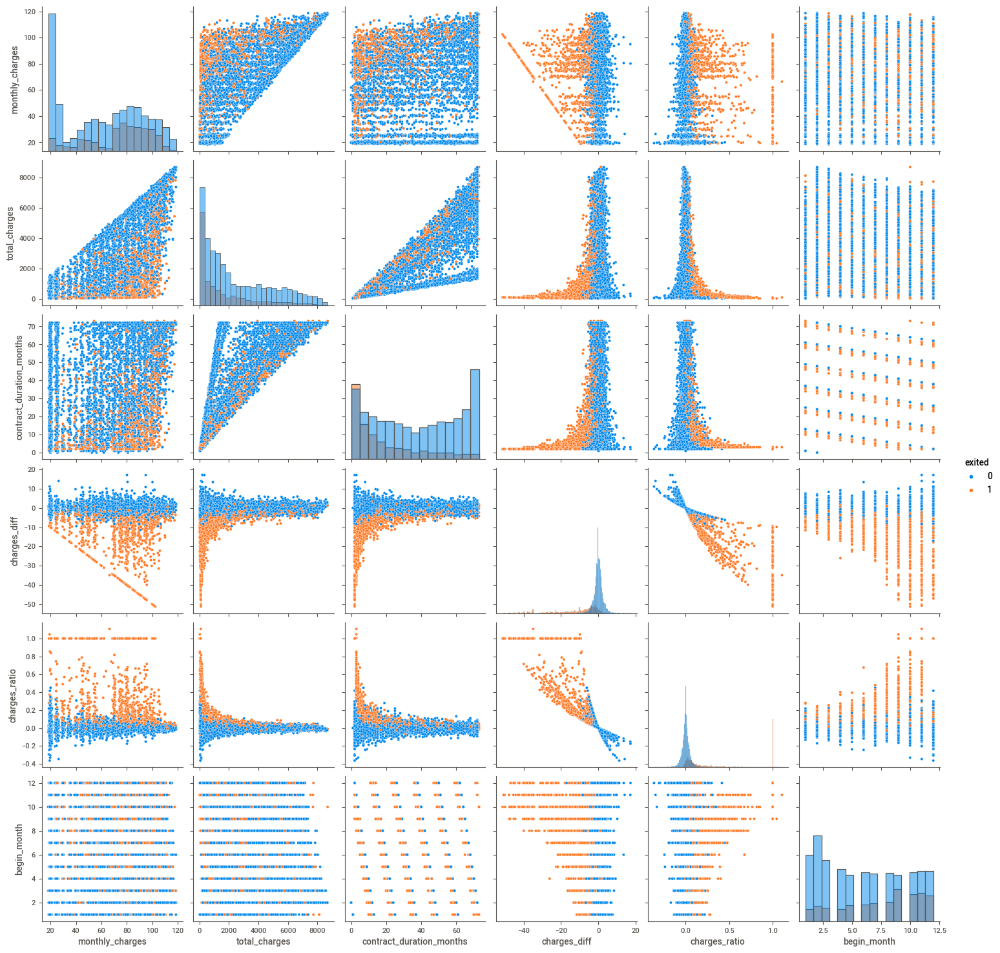

In [50]:
fig = sns.pairplot(data.select_dtypes(exclude="bool"), hue="exited", diag_kind="hist")
plt.show()

Здесь опять же видим достаточно четкую цветовую границу значений целевого признака на графиках для charges_diff. Видим, что для остающихся клиентов charges_diff распределен практически нормально, а для для ушедших - сильный скос влево к отрицательным значениям.

### 1.4.4. Обработка пропусков и аномалий


Посмотрим на пропуски в total_charges:

In [51]:
data.query("total_charges.isna()")

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,senior_citizen,partner,...,streaming_movies,multiple_lines,is_male,exited,has_phone,has_internet,contract_duration_months,charges_diff,charges_ratio,begin_month
488,4472-LVYGI,2020-02-01,NaT,Two year,True,Bank transfer (automatic),52.55,NaN,False,True,...,False,False,False,0,False,True,0,NaN,NaN,2
753,3115-CZMZD,2020-02-01,NaT,Two year,False,Mailed check,20.25,NaN,False,False,...,False,False,True,0,True,False,0,NaN,NaN,2
936,5709-LVOEQ,2020-02-01,NaT,Two year,False,Mailed check,80.85,NaN,False,True,...,True,False,False,0,True,True,0,NaN,NaN,2
1082,4367-NUYAO,2020-02-01,NaT,Two year,False,Mailed check,25.75,NaN,False,True,...,False,True,True,0,True,False,0,NaN,NaN,2
1340,1371-DWPAZ,2020-02-01,NaT,Two year,False,Credit card (automatic),56.05,NaN,False,True,...,False,False,False,0,False,True,0,NaN,NaN,2
3331,7644-OMVMY,2020-02-01,NaT,Two year,False,Mailed check,19.85,NaN,False,True,...,False,False,True,0,True,False,0,NaN,NaN,2
3826,3213-VVOLG,2020-02-01,NaT,Two year,False,Mailed check,25.35,NaN,False,True,...,False,True,True,0,True,False,0,NaN,NaN,2
4380,2520-SGTTA,2020-02-01,NaT,Two year,False,Mailed check,20.00,NaN,False,True,...,False,False,False,0,True,False,0,NaN,NaN,2
5218,2923-ARZLG,2020-02-01,NaT,One year,True,Mailed check,19.70,NaN,False,True,...,False,False,True,0,True,False,0,NaN,NaN,2
6670,4075-WKNIU,2020-02-01,NaT,Two year,False,Mailed check,73.35,NaN,False,True,...,False,True,False,0,True,True,0,NaN,NaN,2


Как видим, это новые клиенты появившиеся 2020-02-01. Заполним для них значение total_charges на основе monthly_charges и contract_duration_months.

In [52]:
data["total_charges"] = data["total_charges"].fillna(
    data.monthly_charges * data.contract_duration_months
)
data["charges_diff"] = data["charges_diff"].fillna(
    data.total_charges / data.contract_duration_months - data.monthly_charges
)
data["charges_ratio"] = data["charges_ratio"].fillna(
    (data.contract_duration_months * data.monthly_charges / data.total_charges) - 1
)

Построим более подробную гистограмму по begin_date в разрезе оттока клиентов:

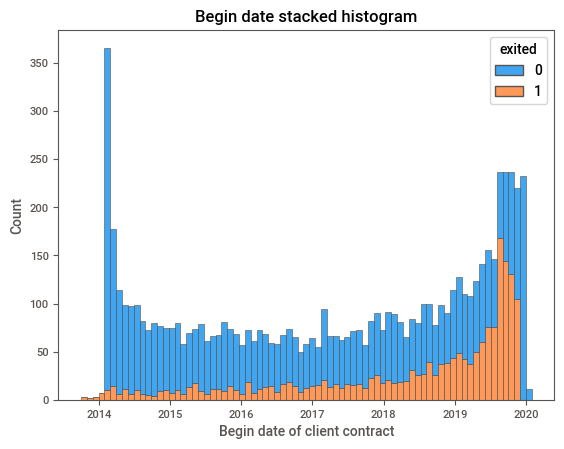

In [53]:
sns.histplot(
    data=data,
    x="begin_date",
    hue="exited",
    bins=data["begin_date"].nunique(),
    multiple="stack",
)
plt.title("Begin date stacked histogram")
plt.xlabel("Begin date of client contract")
plt.show()

Видим, что на графике в самом начале временного периода есть даты, для которых ушли все клиенты, и в конце временного периода есть исключительно новые клиенты без ушедших. Найдем эти даты применив exclusive full join (функция symmetric_difference) к множествам дат ушедших и не ушедших:

In [54]:
excl_join_begin_dates = set(
    data[data["exited"] == 0]["begin_date"]
).symmetric_difference(set(data[data["exited"] == 1]["begin_date"]))
display(excl_join_begin_dates)

{Timestamp('2013-10-01 00:00:00'),
 Timestamp('2013-11-01 00:00:00'),
 Timestamp('2013-12-01 00:00:00'),
 Timestamp('2014-01-01 00:00:00'),
 Timestamp('2020-01-01 00:00:00'),
 Timestamp('2020-02-01 00:00:00')}

~~Так как данные клиентов появившихся в эти даты являются аномалиями, 100% клиентов ушло или 0% клиентов ушло, то следует их удалить из датасета:~~

In [55]:
anomaly_begin_dates = data["begin_date"].isin(excl_join_begin_dates)
print("Anomalies count:", anomaly_begin_dates.sum())

Anomalies count: 259


Посмотрим на самых старых клиентов, которые все отказались от услуг оператора:

In [56]:
early_dates_data_filter = data["begin_date"].isin(
    ["2013-10-01", "2013-11-01", "2013-12-01", "2014-01-01"]
)
with pd.option_context("display.max_columns", None):
    display(data[early_dates_data_filter])

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,is_male,exited,has_phone,has_internet,contract_duration_months,charges_diff,charges_ratio,begin_month
975,2834-JRTUA,2013-11-01,2019-10-01,Two year,True,Electronic check,108.05,7532.15,False,False,False,Fiber optic,True,False,True,True,True,True,True,True,1,True,True,72,-3.436806,0.032853,11
1306,0201-OAMXR,2014-01-01,2019-11-01,One year,False,Credit card (automatic),115.55,8127.60,False,False,False,Fiber optic,True,True,True,True,True,True,True,False,1,True,True,71,-1.076761,0.009406,1
1967,0565-IYCGT,2014-01-01,2019-10-01,One year,True,Credit card (automatic),78.60,5356.45,False,False,False,DSL,True,True,True,True,False,True,True,True,1,True,True,70,-2.079286,0.027173,1
3040,7317-GGVPB,2013-11-01,2019-10-01,Two year,True,Credit card (automatic),108.60,7690.90,False,True,False,Fiber optic,False,True,True,True,True,True,True,True,1,True,True,72,-1.781944,0.016682,11
3111,8809-RIHDD,2014-01-01,2020-01-01,Two year,True,Electronic check,103.40,7372.65,False,True,True,Fiber optic,False,True,True,False,True,True,True,True,1,True,True,73,-2.404795,0.023811,1
3439,0917-EZOLA,2013-10-01,2019-10-01,Two year,True,Bank transfer (automatic),104.15,7689.95,True,True,False,Fiber optic,False,True,True,False,True,True,True,True,1,True,True,73,1.191781,-0.011313,10
3890,3886-CERTZ,2014-01-01,2020-01-01,One year,True,Electronic check,109.25,8109.80,False,True,False,Fiber optic,False,True,True,True,True,True,True,False,1,True,True,73,1.843151,-0.016591,1
4513,8580-QVLOC,2013-10-01,2019-10-01,Two year,False,Credit card (automatic),92.45,6440.25,True,True,True,DSL,True,True,True,True,True,True,True,False,1,True,True,73,-4.227397,0.047917,10
4610,2889-FPWRM,2013-10-01,2019-10-01,One year,True,Bank transfer (automatic),117.80,8684.80,False,True,False,Fiber optic,True,True,True,True,True,True,True,True,1,True,True,73,1.169863,-0.009833,10
4684,6305-YLBMM,2014-01-01,2019-10-01,One year,True,Bank transfer (automatic),104.05,7262.00,False,False,False,Fiber optic,False,True,True,True,True,True,False,True,1,True,True,70,-0.307143,0.002961,1


На графике ниже хорошо видны аномалии в начале графика. Почему ушли все самые старые клиенты, объяснить сложно (их совсем немного, поэтому не будем удалять: это можно использовать в сравнении метрик всех работ на одинаковом (без удаления пропусков) датасете с одинаковым random_state)

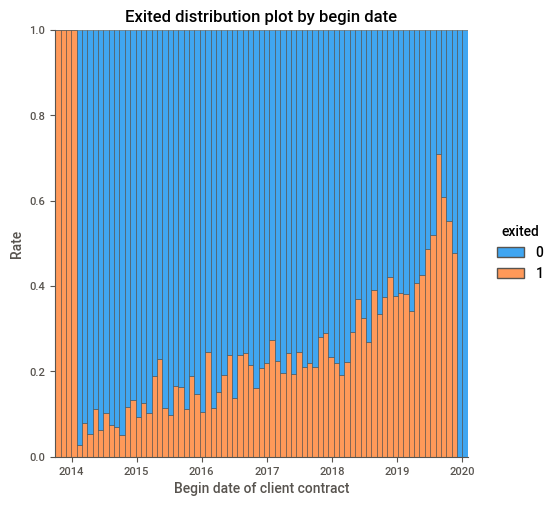

In [57]:
sns.displot(
    data=data,
    x="begin_date",
    hue="exited",
    multiple="fill",
    bins=data["begin_date"].nunique(),
)
plt.title("Exited distribution plot by begin date")
plt.xlabel("Begin date of client contract")
plt.ylabel("Rate")
plt.show()

Минимальный срок действия договора ушедших клиентов:

In [58]:
data[data.exited == 1].contract_duration_months.min()

2

От оставшихся пропусков избавимся, объединив признаки internet_service с has_internet и удалив признак типа datetime - end_date.

In [59]:
data_na_count = data.isna().sum()
data_na_count[data_na_count != 0]

end_date            5174
internet_service    1526
charges_diff          11
charges_ratio         11
dtype: int64

In [60]:
data_na_internet = data["internet_service"].isna()
data["internet_service"] = data["internet_service"].cat.add_categories("No")
data.loc[data_na_internet, ["internet_service"]] = "No"

In [61]:
data = data.drop(columns=["end_date"])

### 1.4.5.  Выбросы, диаграммы размаха


Построим ящики с усами для численных признаков. Добавим на них точечные диаграммы (stripplot), чтобы было видно распределение значений в разрезе целевого признака. Крестиком обозначим среднее арифметическое:

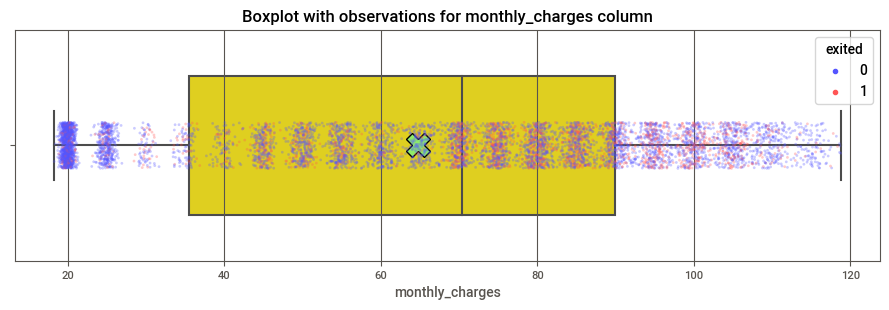

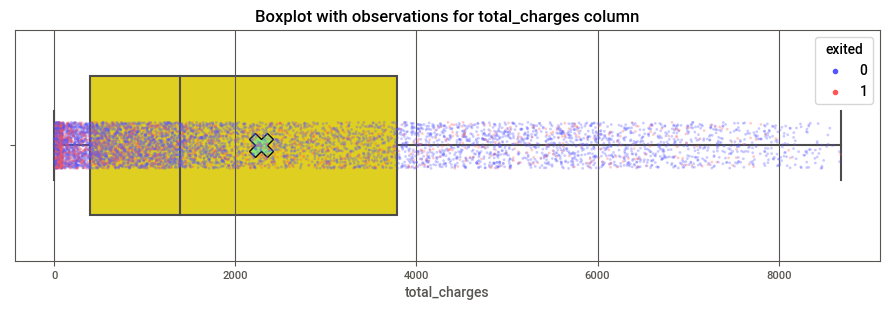

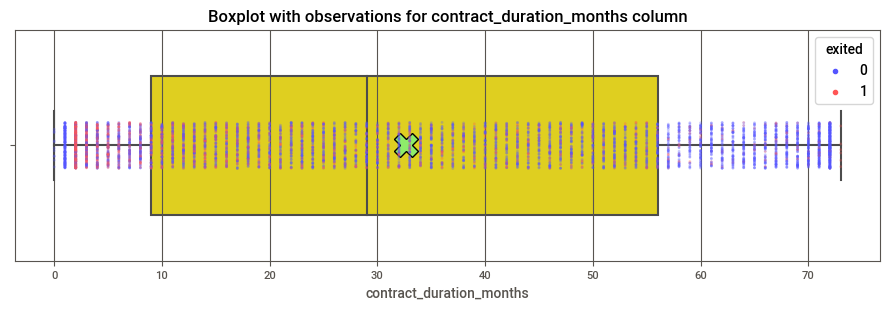

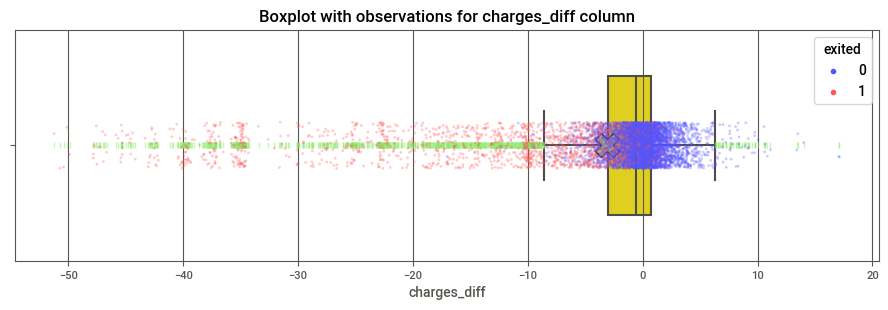

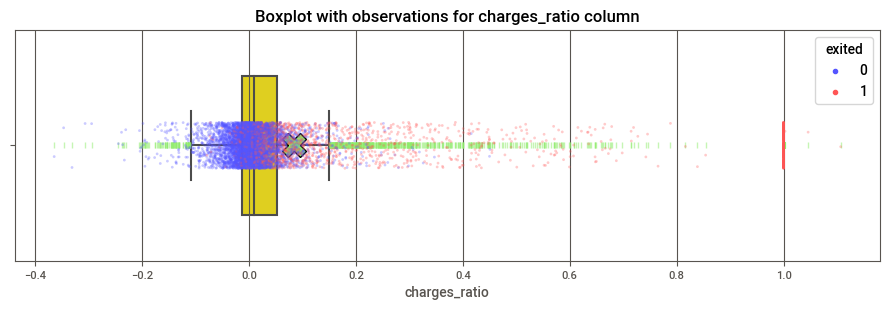

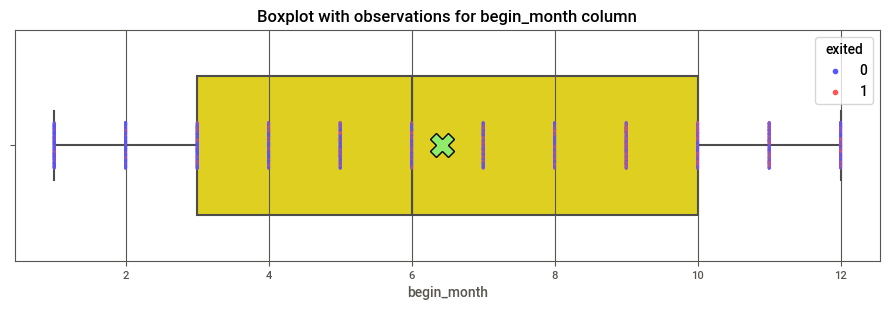

Descriptive statistics for numeric columns:


,monthly_charges,total_charges,contract_duration_months,charges_diff,charges_ratio,begin_month
count,7043.000000,7043.000000,7043.000000,7032.000000,7032.000000,7043.000000
mean,64.761692,2279.734304,32.636519,-3.121719,0.083806,6.421269
std,30.090047,2266.794470,24.407449,8.431027,0.241908,3.578453
min,18.250000,0.000000,0.000000,-51.225000,-0.364455,1.000000
25%,35.500000,398.550000,9.000000,-3.014167,-0.012265,3.000000
50%,70.350000,1394.550000,29.000000,-0.580784,0.010252,6.000000
75%,89.850000,3786.600000,56.000000,0.716856,0.052616,10.000000
max,118.750000,8684.800000,73.000000,17.125000,1.106822,12.000000


In [62]:
columns_for_boxplot = list(data.select_dtypes(include=np.number).columns)
columns_for_boxplot.remove("exited")

for i, column in enumerate(columns_for_boxplot):
    fig, ax = plt.subplots(figsize=(9, 3))

    flierprops = dict(
        marker="|",
        markeredgecolor="#8EEC6A",
        alpha=0.5,
    )

    meanprops = dict(
        marker="X", markeredgecolor="black", markerfacecolor="#8EEC6A", markersize=17
    )
    sns.boxplot(
        data=data[column],
        width=0.6,
        orient="h",
        flierprops=flierprops,
        ax=ax,
        showmeans=True,
        color="#FFE900",
        meanprops=meanprops,
    )
    sns.stripplot(
        x=column,
        data=data,
        alpha=0.3,
        size=2,
        palette="seismic",
        linewidth=0,
        orient="h",
        ax=ax,
        hue="exited",
    )
    ax.set_yticklabels("")
    ax.xaxis.grid(True)
    # ax.legend(title="Exited", loc="upper right")
    fig.tight_layout()
    plt.title(f"Boxplot with observations for {column} column")
    plt.show()

# sns.boxplot()
print("Descriptive statistics for numeric columns:")
display(data[columns_for_boxplot].describe(include="all"))

Здесь мы видим, что выбросы есть только у добавленного нами признака charges_diff. Как раз эти выбросы влево к отрицательным значениям частично и являются одним из индикаторов того, что клиент может покинуть оператора. И наоборот клиенты, у которых есть переплата (charges_diff>0, таких гораздо меньше чем с долгами) - от оператора чаще всего не уходят.

Кроме того, видим что у total_charges медиана значительно меньше среднего. Это как раз может говорить о том, что "накопительный эффект", то есть суммарный доход от клиента стремится к меньшей величине. То есть, как раз можно пытаться удерживать клиентов, чтобы исправить эту ситуацию.

А у monthly_charges - наоборот медиана немного больше среднего. Это говорит о том что у ежемесячных платежей есть небольшое смещение распределения в бОльшую сторону. Посмотрим также на тренд в изменении monthly_charges в зависимости от даты подключения клиента:

In [63]:
mean_monthly_charges_by_date = data.groupby("begin_date")["monthly_charges"].mean()

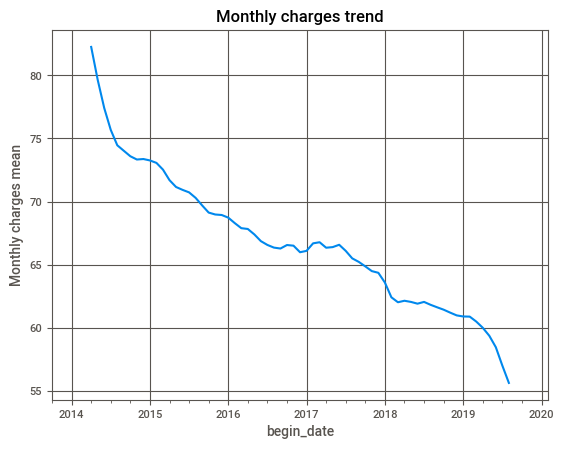

In [64]:
seasonal_decompose(mean_monthly_charges_by_date).trend.plot()
plt.title("Monthly charges trend")
plt.ylabel("Monthly charges mean")
plt.grid()
plt.show()

Видим однозначно нисходящий тренд с очень короткими участками бокового тренда. Это опять же подтверждает разумность намерений пытаться удерживать клиентов, так как ежемесячные платежи для новых клиетов постоянно снижаются, а старый же клиент будут приносить в сравнении с новым больше ежемесячного дохода.

### 1.4.6. Выводы


1. Больше всего клиентов, у которых подключены <b>услуги и телефонии и интернета (4835)</b>, далее клиенты <b>только с телефонией (1526)</b>, и меньше всего клиентов с <b>одним лишь интернетом (628)</b>.

2. Больше всего клиентов <b>ушло будучи подключенными к обеим услугам (1586 против 3249 оставшихся)</b>, клиентов подключенных только к интернету <b>ушло 170 к 512 оставшимся</b>, а из клиентов подключенных только к телефонии <b>ушло меньше всего - 113 к 1413</b>

3. Есть <b>дисбаланс классов</b>: только ~27% клиентов в датасете расторгли договор
4. Есть данные о <b>расторжении договоров только за 4 месяца</b> с октября 2019 по январь 2020 включительно (только 4 уникальных значения для end_date)
5. Дата <b>начала договора - с 2013-10-01 по 2020-02-01</b>. Гистограмма даты начала договора имеет самый большой пик в начале доступного временного промежутка (может быть, внесение в систему старых клиентов?) 
6. Чем больше <b>период за который платит</b> клиент, тем значительно меньше вероятность его ухода (снижается ~ в 4 раза при переходе от более короткого к более длительному периоду оплаты)
7. В два раза чаще уходят клиенты согласившиеся на <b>получение электронных чеков</b>, нежели те, кто до сих пор требует бумажный чек
8. Клиенты производящие оплату по <b>электронной квитанции</b> (electronic check) уходят более чем в 2 раза чаще, чем остальные клиенты (квитанция по почте, автоматический перевод, автоматическая оплата по карте).
9. В два раза чаще уходят те кто не имеет <b>иждевенцев (dependents)</b>, <b>а без супруги(а)</b> - уходят в полтора раза чаще чем те, у кого они есть
10. Клиенты использующие следующие услуги уходили реже (в среднем почти в 2 раза) чем те клиенты, у которых они не подключены: 
    * <b>интернет по оптоволокну</b>
    * <b>интернет-безопасность</b>
    * <b>выделенная линия технической поддержки</b>
11. <b>Клиенты-пенсионеры</b> расторгают договор почти в 2 раза чаще, чем люди допенсионного возраста
12. Чем <b>дольше клиент</b> пользуется услугами провайдера, тем меньше вероятность его ухода, в свои первые 4 месяца уходит ~ половина клиентов
13. Клиенты <b>пришедшие в начале года</b> (в особенности январь - февраль) уходят реже, чем те кто стал клиентом в последней трети года (~ в 3 раза)
14. В основном уходят те у кого <b>отрицательный баланс charges_diff</b> (charges_diff - разница между total_charges и произведением monthly_charges на продолжительность пользования услугами в месяцах)
    * у  этого признака самая высокая корреляция с exited
    * на pairplot графиках для charges_diff видно четкую цветовую границу значений целевого признака 
    * для остающихся клиентов charges_diff распределен практически нормально, а для для ушедших - сильный скос влево к отрицательным значениям
    * выбросы есть только у добавленного нами признака charges_diff
    * эти выбросы влево к отрицательным значениям частично и являются одним из индикаторов того, что клиент может покинуть оператора
    * и наоборот клиенты, у которых есть переплата (charges_diff > 0, таких гораздо меньше чем с долгами) - от оператора чаще всего не уходят.
15. <b>Пол клиента</b> практически не влияет на вероятность ухода
16. Есть много признаков с <b>высокой корреляцией</b>, необходимо обращать на это внимание в случае использования чувствительной к таким признакам модели
17. У суммарных платежей <b>total_charges</b> медиана значительно меньше среднего. Это как раз может говорить о том, что "накопительный эффект", то есть суммарный доход от клиента стремится к меньшей величине. То есть, можно пытаться удерживать клиентов, чтобы исправить эту ситуацию, скорее всего невыгодную телеком-оператору.
18. У ежемесячной оплаты <b>montlhy_charges мы обнаружили нисходящий тренд</b>, что опять же подтверждает разумность намерений пытаться удерживать клиентов, так как ежемесячные платежи для новых клиетов постоянно снижаются, а старый же клиент будут приносить в сравнении с новым больше ежемесячного дохода.

## 1.5. Вопросы


1. Насколько репрезентативны собранные командой оператора данные (данные собраны для "некоторых клиентов"), достаточно ли они характеризуют реальный набор клиентов?
2. Почему данные в end_date только равные последним 4 месяцам? Можно ли получить больше данных или это совсем другой датасет (обсуждалось на встрече, что есть более полный датасет)? 
3. Может ли быть автоматическое расторжение договора по неоплате? Если да, то наше предсказание об уходе клиента на основе его долга может не иметь смысла, так как вряд ли злобному неплательщику поможет промокод или специальные условия.
    

## 1.6. План работы


1. Знакомство с задачей и данными, предварительный анализ
    * знакомство с ТЗ, его анализ
    * чтение данных и анализ структуры данных
    * предобработка, предварительный разведочный анализ (EDA) для формулирования вопросов к заказчику
    * обсуждение с заказчиком (или другим уполномоченным лицом):
        * что он хочет видеть в итоге проделанной работы, как будет использовать результат
        * как заказчик собирается оценивать качество полученного результата
        * вопросов появившихся после EDA (например, вопросов по признакам, полноте данных, источнике данных и т.д.)
2. Исследовательский анализ данных и обработка
    * доработка EDA после уточнения целей
    * feature extraction & engineering - извлечение из данных новых признаков и преобразование признаков в понятный для модели вид
    * анализ и обработка пропусков, выбросов, аномалий
    * feature selection - отбор признаков для использования в модели
3. Обучение моделей
    * разбиение данных (CV, 25% - тестовые, random_state=130323)
    * построение dummy-модели как baseline для сравнения
    * выбор моделей для обучения и построение для них пайплайнов (возможно, с использованием кодирования/масштабирования или других типов преобразований в зависимости от модели)
    * подбор гиперпараметров моделей
    * кросс-валидация, сравнение качества моделей
4. Тестирование модели, оформление результатов
    * тестирование лучшей модели
    * анализ результатов тестирования, выводы
    * подготовка результатов
        * определение важности признаков
        * построение ROC кривой
        * построение матрицы ошибок


## 1.7. Feature selection


### 1.7.1. Утечка целевого признака


Необходимо предотвратить утечку целевого признака. То есть, не должны в качестве признаков для обучения модели использоваться те данные из нашего датасета которые не будут доступны в новых данных для дальнейшего прогнозирования. Попробуем проанализировать какие признаки могут таковыми являться:
1. `End_date` - однозначно является указателем на целевой признак. Его на вход модели не подаем.
2. Дата `begin_date` вместе с end_date - например, разница между этими датами, аналогично, скорее является утечкой целевого признака. 
    * Сам по себе признак begin_date и его производные, например разница между датой актуальности датасета и begin_date тоже не стоит использовать, иначе получается, что модель обучается частично на истории данных, это нельзя делать не соблюдая все требования к предсказанию значений для временного ряда (например, нельзя на основе будущих значений делать предсказания для предыдущих - в качестве CV необходимо использовать TimeSeriesSplit). 
    * Мы сделали признак не зависящий от begin_date и end_date напрямую, charges_diff:
$$
charges\_diff= {\frac{total\_charges}{contract\_duration\_months}} - monthly\_charges
$$
        * Он будет доступен в новых данных для предсказания, т.к. в формуле  для подсчета длительности контракта пользователя будет использоваться дата актуальности новых данных (`2020-01-01` в формуле для наших данных). И он не содержит в себе продолжительность контракта , т.к. она сократилась с продолжительностью контракта, содержащейся в total_charges, ведь total_charges по идее должна быть равна `total_charges=contract_duration_months * monthly_charges`, но как оказывается здесь еще содержится долг/переплата клиента, как раз которую мы и получаем в этом признаке. Аналогичные рассуждения справедливы для charges_ratio:
$$
charges\_ratio= {\frac{contract\_duration\_months * monthly\_charges}{total\_charges}} -1
$$
P.S. Здесь бы очень тщательно проанализировать с бизнес-аналитиком/поставщиком данных природу появления этой разницы: может быть это утечка, заложенная еще на этапе сбора данных, если расторжение договора клиента приводит к появлению этой разницы (например, списание за неполный месяц или продолжение начислений клиенту еще некоторое время и т.д.)

3. `total_charges` в случае наличия и begin_date, и monthly_charges тоже можно воспринимать как утечку, т.к. begin_date + total_charges/monthly_charges - получится опять end_date. Стоит удалить из признаков для моделирования begin_date.

### 1.7.2. Незначимые признаки


Признак is_male (сделанный на основе gender) показал отсутствие корреляций с каким-либо другим признаком, поэтому скорее всего не имеет смысла использовать его при обучении.

### 1.7.3. Сильно коррелирующие признаки


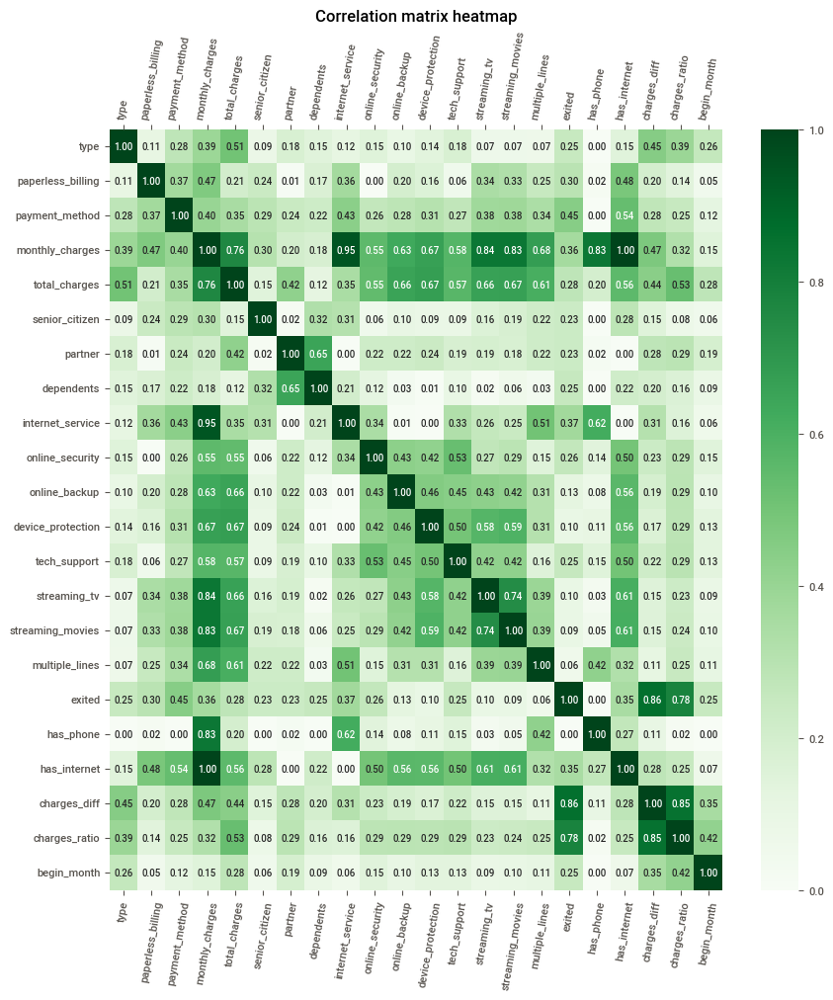

In [65]:
_, ax = plt.subplots(figsize=(10, 10))
reduced_phik = phik_corr.drop(
    columns=["contract_duration_months", "is_male"],
    index=["contract_duration_months", "is_male"],
)
fig = sns.heatmap(
    reduced_phik,
    xticklabels=reduced_phik.columns.values,
    yticklabels=reduced_phik.columns.values,
    annot=True,
    annot_kws={"fontsize": 7},
    fmt=".2f",
    ax=ax,
    cmap="Greens",
)
fig.set_title(f"Correlation matrix heatmap")
ax.tick_params(axis="x", top=True, bottom=True, labeltop=True, labelrotation=80)
# plt.xticks(ha="right")
plt.show()

1. Признаки end_date, begin_date, is_male, contract_duration_months мы уже исключили: их корреляций здесь нет.
2. monthly_charges - кандидат на удаление, сильные корреляции (>0.8) cо streaming_tv, streaming_movies, has_phone и особенно c internet service
3. charges_diff и charges_ratio - тоже достаточно сильно коррелируют друг с другом, возможно для некоторых моделей (например, для лог. регрессии) будет лучше оставить один из них

Далее в пайплайне проверим, ухудшают ли данные коррелирующие между собой признаки результат в различных наборах для DropFeatures-трансформера из feature-engine.

Посмотрим на корреляции по Пирсону ниже, там сильные корреляции только у charges_ratio и charges_diff - в логистической регресси добавим исключение одного их них в перебор параметров.

In [66]:
corr_matrix = data.select_dtypes(include=["number"]).corr()

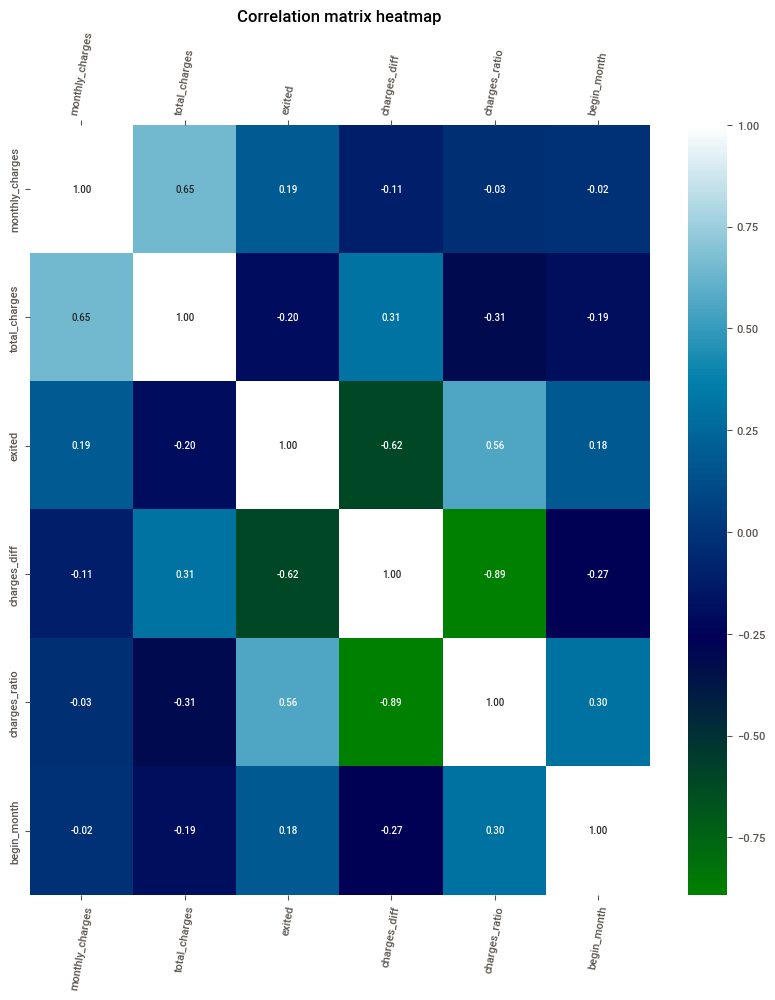

In [67]:
_, ax = plt.subplots(figsize=(10, 10))
reduced_corr = corr_matrix.drop(
    columns=["contract_duration_months"],
    index=["contract_duration_months"],
)
fig = sns.heatmap(
    reduced_corr,
    xticklabels=reduced_corr.columns.values,
    yticklabels=reduced_corr.columns.values,
    annot=True,
    annot_kws={"fontsize": 7},
    fmt=".2f",
    ax=ax,
    cmap="ocean",
)
fig.set_title(f"Correlation matrix heatmap")
ax.tick_params(axis="x", top=True, bottom=True, labeltop=True, labelrotation=80)
# plt.xticks(ha="right")
plt.show()

## 1.8. Pipeline


### 1.8.1. Кастомные классы и функции


Класс для применения функции к датафрейму - будем использовать для добавления признаков:

In [68]:
class DataframeFunctionTransformer(TransformerMixin):
    def __init__(self, func, **kwargs):
        self.func = func
        self.args = kwargs

    def transform(self, input_df, **transform_params):
        return self.func(input_df, **self.args)

    def fit(self, X, y=None, **fit_params):
        return self

Функция для получения значения признаков charges_diff и charges_ratio:

In [69]:
def add_balance_metrics(dataframe, **kwargs):
    df = dataframe.copy()
    if "last_full_month_in_data" in kwargs:
        last_full_month_in_data = pd.to_datetime(kwargs["last_full_month_in_data"])
    else:
        last_full_month_in_data = pd.to_datetime("2020-01-01")

    if "type_of_relation" in kwargs:
        type_of_relation = kwargs["type_of_relation"]
    else:
        type_of_relation = "both"

    contract_duration_months = (
        (
            (
                df["end_date"].map(
                    lambda date: last_full_month_in_data if pd.isnull(date) else date
                )
                - df["begin_date"]
            )
            / np.timedelta64(1, "M")
        )
        .round()
        .astype(int)
    ) + 1

    if type_of_relation == "both" or type_of_relation == "diff":
        df["charges_diff"] = (
            df["total_charges"] / contract_duration_months - df["monthly_charges"]
        )
    if type_of_relation == "both" or type_of_relation == "ratio":
        df["charges_ratio"] = (
            contract_duration_months * df["monthly_charges"] / df["total_charges"]
        ) - 1  # вычитаем 1 чтобы матожидание было в нуле

    df["contract_duration_months"] = contract_duration_months

    #     df["services_count_weighted"] = pd.concat(
    #         [
    #             df["internet_service"] == "Fiber optic",
    #             df["internet_service"] == "DSL",
    #             data[
    #                 [
    #                     "online_security",
    #                     "online_backup",
    #                     "device_protection",
    #                     "device_protection",
    #                     "tech_support",
    #                     "streaming_tv",
    #                     "streaming_tv",
    #                     "streaming_movies",
    #                     "streaming_movies",
    #                     "multiple_lines",
    #                     "multiple_lines",
    #                     "has_phone",
    #                 ]
    #             ],
    #         ],
    #         axis=1,
    #     ).sum(axis=1)

    #     df["family_ratio"] = df.services_count_weighted / (1 + df.partner + df.dependents)

    return df

Класс для дебага:

In [70]:
class Debug(BaseEstimator, TransformerMixin):
    def transform(self, X):
        self.shape = X.shape

        print(self.shape)
        self.copy_of_X = X.copy()
        print(X[:10])  # TODO: check 10 is not less than len
        return X

    def fit(self, X, y=None, **fit_params):
        return self

### 1.8.2. Сборка пайплайна


Сделаем пайплайны для обработки признаков:
* feature_creation_pipe - извлечение новых признаков из существующих данных
* num_pipe - для обработки численных признаков
* cat_pipe - для обработки категориальных признаков
* transformer - для разделения обработки этих признаков

#### 1.8.2.1. Feature extraction


In [71]:
# date feature pipeline
feature_creation_pipe = Pipeline(
    [
        # (
        #     "add_month",
        #     DataframeFunctionTransformer(add_month, fields=["begin_date"], drop=False),
        # ),
        (
            "add_balance_metrics",
            DataframeFunctionTransformer(
                add_balance_metrics, last_full_month_in_data="2020-01-01"
            ),
        ),
    ]
)

#### 1.8.2.2. Обработка категориальных признаков


In [72]:
# categorial feature pipeline
cat_pipe = Pipeline(
    [
        # replaces missing data in categorials with 'No', because this indicates there is no service
        ("imputer", CategoricalImputer(imputation_method="missing", fill_value="n/a")),
        ("encoder", None),
        ("scaler", None),
    ]
)

#### 1.8.2.3. Обработка численных признаков


In [73]:
# numeric features pipeline
num_pipe = Pipeline(
    [
        (
            "no_charges_imputer",
            ArbitraryNumberImputer(
                variables=[
                    "total_charges",
                    "charges_diff",
                    "charges_ratio",
                ]
            ),
        ),
        ("default_imputer", None),
        ("scaler", None),
    ]
)

#### 1.8.2.4. ColumnTransformer


In [74]:
# applying num_pipe/cat_pipe to dynamically selecting numeric types
transformer = ColumnTransformer(
    transformers=[
        ("cat", cat_pipe, make_column_selector(dtype_include=["category", "object"])),
        ("num", num_pipe, make_column_selector(dtype_include=np.number)),
    ],
    remainder="passthrough",
    n_jobs=-1,
)

# to get feature names after ColumnTransformer:
# numeric_columns = list(df.select_dtypes('number'))
# categorical_columns = list(df.select_dtypes(['category','boolean']))
# remainder_colummns=list(df.select_dtypes('boolean'))

In [75]:
transformer.fit_transform(
    feature_creation_pipe.fit_transform(data_for_pipeline.drop(columns=["exited"]))
)[0]

array(['7590-VHVEG', 'Month-to-month', 'Electronic check', 'DSL', 'n/a',
       29.85, 29.85, 0.0, 0.0, 1.0, Timestamp('2020-01-01 00:00:00'), NaT,
       True, False, True, False, False, True, False, False, False, False,
       False], dtype=object)

Видим, что категориальные фичи при первой строке с cat_pipe в transformers идут сначала, для дальнейшей передачи их в катбуст, сгенерируем список их индексов c нуля:

In [76]:
cat_features = list(
    range(
        data_for_pipeline.drop(columns=["customer_id"])
        .select_dtypes(["category", "object"])
        .shape[1]
    )
)
cat_features

[0, 1, 2, 3]

## 1.9. Обучение моделей


Для оценки качества используем roc_auc:

In [77]:
TRGT_METRIC = "roc_auc"

Другие константы для измерения качества:

In [78]:
RANDOM_STATE = 130323
CV = StratifiedKFold(shuffle=True, random_state=RANDOM_STATE)

Признаки:

In [79]:
X, y = data_for_pipeline.drop(columns=["exited"]), data_for_pipeline["exited"]

In [80]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=RANDOM_STATE, stratify=y
)

Посмотрим на входные признаки:

In [81]:
X_train.head()

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,is_male
1164,4782-OSFXZ,2014-03-01,NaT,Two year,True,Bank transfer (automatic),82.70,5831.20,True,True,False,DSL,True,True,True,True,False,True,Yes,False
6050,0487-RPVUM,2015-01-01,NaT,Month-to-month,False,Bank transfer (automatic),99.40,5943.65,False,True,False,Fiber optic,True,False,True,True,True,False,Yes,True
4073,7683-CBDKJ,2018-09-01,2019-11-01,Month-to-month,True,Electronic check,65.45,937.60,False,True,True,DSL,True,True,False,False,True,False,No,True
4426,8652-YHIYU,2018-10-01,NaT,One year,True,Credit card (automatic),79.50,1264.20,False,False,True,Fiber optic,False,False,False,True,False,False,Yes,False
5924,2236-HILPA,2014-12-01,NaT,Two year,False,Credit card (automatic),20.65,1218.45,False,True,True,NaN,False,False,False,False,False,False,No,True


Обработаем пропуски в пайплайне, не будем генерить отдельные признаки has_phone/has_internet, а заполним отдельной категорией 'n/a' пропуски в multiple_lines и internet_service. В случае необходимости OneHotEncoder сгенерирует нам бинарные признаки на основе этих категориальных, аналогичные has_phone/has_internet.

### 1.9.1. Проверка модели на адекватность


Построим dummy модель для сравнения с ее метрикой результатов наших моделей

In [82]:
dummy_classifier = DummyClassifier(strategy="stratified", random_state=RANDOM_STATE)
cross_val_score(
    dummy_classifier,
    X=X_train,
    y=y_train,
    cv=CV,
    scoring=TRGT_METRIC,
).mean()

0.500145192060755

### 1.9.2. Catboost


In [83]:
cbc_model = CatBoostClassifier(verbose=False, auto_class_weights=None)

In [84]:
pipeline_cbc = Pipeline(
    [
        ("feature_creation_pipe", feature_creation_pipe),
        ("drop", DropFeatures(["end_date", "begin_date", "customer_id"])),
        ("transformer", transformer),
        # ("dbg0", Debug()),
        ("estimator", cbc_model),
    ]
)

Для подбора гиперпараметров будем использвать класс optuna.integration.OptunaSearchCV, который позволяет использовать библиотеку optuna в sklearn-стиле и выдает те же значения необходимой нам метрики ROC AUC на зафиксированной нами кросс-валидации, что и cross_val_score. 

In [85]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    param_distributions = {
        "estimator__max_depth": optuna.distributions.IntDistribution(6, 7),
        "estimator__iterations": optuna.distributions.IntDistribution(
            800, 900, step=50
        ),
        "estimator__learning_rate": optuna.distributions.FloatDistribution(
            0.001, 0.02, step=0.001
        ),
        "estimator__cat_features": optuna.distributions.CategoricalDistribution(
            [cat_features]
        ),
        "drop__features_to_drop": optuna.distributions.CategoricalDistribution(
            [
                ["end_date", "begin_date", "customer_id"],
                ["end_date", "begin_date", "customer_id", "monthly_charges"],
            ]
        ),
    }

    optuna_search = optuna.integration.OptunaSearchCV(
        pipeline_cbc,
        param_distributions,
        # enable_pruning=True,
        random_state=RANDOM_STATE,
        scoring=TRGT_METRIC,
        cv=CV,
        timeout=900,
    )

In [86]:
%%time
optuna_search.fit(X_train, y_train)
optuna_search.best_estimator_

[I 2023-04-17 11:12:25,711] A new study created in memory with name: no-name-326bd601-3942-4245-9a1d-edecbde9b6b0
[I 2023-04-17 11:12:46,142] Trial 0 finished with value: 0.9396996905120047 and parameters: {'estimator__max_depth': 7, 'estimator__iterations': 850, 'estimator__learning_rate': 0.013000000000000001, 'estimator__cat_features': [0, 1, 2, 3], 'drop__features_to_drop': ['end_date', 'begin_date', 'customer_id', 'monthly_charges']}. Best is trial 0 with value: 0.9396996905120047.
[I 2023-04-17 11:13:07,183] Trial 1 finished with value: 0.938731390756765 and parameters: {'estimator__max_depth': 7, 'estimator__iterations': 900, 'estimator__learning_rate': 0.016, 'estimator__cat_features': [0, 1, 2, 3], 'drop__features_to_drop': ['end_date', 'begin_date', 'customer_id', 'monthly_charges']}. Best is trial 0 with value: 0.9396996905120047.
[I 2023-04-17 11:13:26,703] Trial 2 finished with value: 0.9392101373696928 and parameters: {'estimator__max_depth': 7, 'estimator__iterations': 9

CPU times: user 18min 3s, sys: 4min 30s, total: 22min 33s
Wall time: 3min 12s


Pipeline(steps=[('feature_creation_pipe',
                 Pipeline(steps=[('add_balance_metrics',
                                  <__main__.DataframeFunctionTransformer object at 0x7ffb8d542730>)])),
                ('drop',
                 DropFeatures(features_to_drop=['end_date', 'begin_date',
                                                'customer_id'])),
                ('transformer',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   Categoric...
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ffb8d5b0f10>),
                                                 ('num',
                                                  Pipeline(steps=[('no_charges_imputer',
                                                                   ArbitraryNumberImputer(variables=['total_charges',
                                                                                                     'charges_diff',
                                                                                                     'charges_ratio'])),
                                                                  ('default_imputer',
                                                                   None),
                                                                  ('scaler',
                                                                   None)]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ffb8ccb97c0>)])),
                ('estimator',
                 <catboost.core.CatBoostClassifier object at 0x7ffb8d542070>)])

In [87]:
optuna_search.best_params_

{'estimator__max_depth': 7,
 'estimator__iterations': 900,
 'estimator__learning_rate': 0.011,
 'estimator__cat_features': [0, 1, 2, 3],
 'drop__features_to_drop': ['end_date', 'begin_date', 'customer_id']}

In [88]:
optuna_search.best_score_

0.9398438572791262

### 1.9.3. Logistic Regression


In [89]:
lr_model = LogisticRegression(random_state=RANDOM_STATE)

In [90]:
pipeline_lr = Pipeline(
    [
        ("feature_creation_pipe", feature_creation_pipe),
        ("drop", DropFeatures(["end_date", "begin_date", "customer_id", "is_male"])),
        ("transformer", transformer),
        # ("dbg0", Debug()),
        ("estimator", lr_model),
    ]
)

In [91]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    param_distributions = {
        "estimator__max_iter": optuna.distributions.IntDistribution(700, 1100, step=50),
        "estimator__solver": optuna.distributions.CategoricalDistribution(
            ["lbfgs", "sag", "liblinear"]
        ),
        "estimator__class_weight": optuna.distributions.CategoricalDistribution(
            ["balanced", None]
        ),
        "transformer__cat__encoder": optuna.distributions.CategoricalDistribution(
            [
                OneHotEncoder(
                    drop="first",
                    handle_unknown="infrequent_if_exist",
                    min_frequency=0.01,
                    max_categories=30,
                )
            ]
        ),
        "transformer__num__scaler": optuna.distributions.CategoricalDistribution(
            [
                StandardScaler(),
                PowerTransformer(),
            ]
        ),
        # "drop__features_to_drop": optuna.distributions.CategoricalDistribution(
        #     [
        #         ["end_date", "begin_date", "customer_id", "is_male"],
        #         ["end_date", "begin_date", "customer_id", "is_male", "monthly_charges"],
        #         [
        #             "end_date",
        #             "begin_date",
        #             "customer_id",
        #             "is_male",
        #             "monthly_charges",
        #             "multiple_lines",
        #             "streaming_tv",
        #             "streaming_movies",
        #         ],  # добавим мало коррелирующие c exited признаки
        #     ]
        # ),
        "feature_creation_pipe__add_balance_metrics": optuna.distributions.CategoricalDistribution(
            [
                DataframeFunctionTransformer(
                    add_balance_metrics, type_of_relation="ratio"
                ),
                DataframeFunctionTransformer(
                    add_balance_metrics, type_of_relation="diff"
                ),
                DataframeFunctionTransformer(
                    add_balance_metrics, type_of_relation="both"
                ),
            ]
        ),
        "transformer__num__no_charges_imputer__variables": optuna.distributions.CategoricalDistribution(
            [None]
        ),
    }

    optuna_search_lr = optuna.integration.OptunaSearchCV(
        pipeline_lr,
        param_distributions,
        random_state=RANDOM_STATE,
        scoring=TRGT_METRIC,
        cv=CV,
        timeout=900,
    )

In [92]:
%%time
optuna_search_lr.fit(X_train, y_train)
optuna_search_lr.best_estimator_

[I 2023-04-17 11:15:38,769] A new study created in memory with name: no-name-0387a9b7-53e9-432c-abf7-8d5a4ad4d8fc
[I 2023-04-17 11:15:39,979] Trial 0 finished with value: 0.9378047251295867 and parameters: {'estimator__max_iter': 1050, 'estimator__solver': 'sag', 'estimator__class_weight': None, 'transformer__cat__encoder': OneHotEncoder(drop='first', handle_unknown='infrequent_if_exist',
              max_categories=30, min_frequency=0.01), 'transformer__num__scaler': PowerTransformer(), 'feature_creation_pipe__add_balance_metrics': <__main__.DataframeFunctionTransformer object at 0x7ffb8c9330a0>, 'transformer__num__no_charges_imputer__variables': None}. Best is trial 0 with value: 0.9378047251295867.
[I 2023-04-17 11:15:41,488] Trial 1 finished with value: 0.9321272746450454 and parameters: {'estimator__max_iter': 1100, 'estimator__solver': 'sag', 'estimator__class_weight': 'balanced', 'transformer__cat__encoder': OneHotEncoder(drop='first', handle_unknown='infrequent_if_exist',
    

CPU times: user 29.8 s, sys: 1min 15s, total: 1min 45s
Wall time: 13.2 s


Pipeline(steps=[('feature_creation_pipe',
                 Pipeline(steps=[('add_balance_metrics',
                                  <__main__.DataframeFunctionTransformer object at 0x7ffb8cc80f70>)])),
                ('drop',
                 DropFeatures(features_to_drop=['end_date', 'begin_date',
                                                'customer_id', 'is_male'])),
                ('transformer',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('cat',
                                                  Pipeline(steps=[('imputer'...
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ffb8cc80190>),
                                                 ('num',
                                                  Pipeline(steps=[('no_charges_imputer',
                                                                   ArbitraryNumberImputer()),
                                                                  ('default_imputer',
                                                                   None),
                                                                  ('scaler',
                                                                   PowerTransformer())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ffb8cc80d90>)])),
                ('estimator',
                 LogisticRegression(class_weight='balanced', max_iter=750,
                                    random_state=130323, solver='liblinear'))])

In [93]:
optuna_search_lr.best_params_

{'estimator__max_iter': 750,
 'estimator__solver': 'liblinear',
 'estimator__class_weight': 'balanced',
 'transformer__cat__encoder': OneHotEncoder(drop='first', handle_unknown='infrequent_if_exist',
               max_categories=30, min_frequency=0.01),
 'transformer__num__scaler': PowerTransformer(),
 'feature_creation_pipe__add_balance_metrics': <__main__.DataframeFunctionTransformer at 0x7ffb8cc801f0>,
 'transformer__num__no_charges_imputer__variables': None}

In [94]:
optuna_search_lr.best_score_

0.9381986049455187

Убедимся, что optuna выдает те же значения необходимой нам метрики ROC AUC на зафиксированной нами кросс-валидации, что и cross_val_score:

In [95]:
cv_score = cross_val_score(
    optuna_search_lr.best_estimator_, X_train, y_train, scoring=TRGT_METRIC, cv=CV
)

In [96]:
cv_score.mean()

0.9381986049455187

### 1.9.4. RandomForestClassifier


In [97]:
rfc_model = RandomForestClassifier(random_state=RANDOM_STATE)

In [98]:
pipeline_rfc = Pipeline(
    [
        ("feature_creation_pipe", feature_creation_pipe),
        ("drop", DropFeatures(["end_date", "begin_date", "customer_id"])),
        ("transformer", transformer),
        # ("dbg0", Debug()),
        ("estimator", rfc_model),
    ]
)

Для подбора гиперпараметров будем использвать класс optuna.integration.OptunaSearchCV, который позволяет использовать библиотеку optuna в sklearn-стиле:

In [99]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    param_distributions = {
        "estimator__max_depth": optuna.distributions.IntDistribution(4, 12),
        "estimator__n_estimators": optuna.distributions.IntDistribution(
            30, 300, step=5
        ),
        "estimator__class_weight": optuna.distributions.CategoricalDistribution(
            ["balanced", "balanced_subsample", None]
        ),
        "transformer__cat__encoder": optuna.distributions.CategoricalDistribution(
            [OrdinalEncoder(dtype=int)]
        ),
    }

    optuna_search_rfc = optuna.integration.OptunaSearchCV(
        pipeline_rfc,
        param_distributions,
        random_state=RANDOM_STATE,
        scoring=TRGT_METRIC,
        cv=CV,
        timeout=900,
    )

In [100]:
%%time
optuna_search_rfc.fit(X_train, y_train)
optuna_search_rfc.best_estimator_

[I 2023-04-17 11:15:52,926] A new study created in memory with name: no-name-22c36501-651d-4165-8948-d6b78191d0f7
[I 2023-04-17 11:15:56,867] Trial 0 finished with value: 0.9326914383723185 and parameters: {'estimator__max_depth': 11, 'estimator__n_estimators': 190, 'estimator__class_weight': None, 'transformer__cat__encoder': OrdinalEncoder(dtype=<class 'int'>)}. Best is trial 0 with value: 0.9326914383723185.
[I 2023-04-17 11:16:01,248] Trial 1 finished with value: 0.9337923809873218 and parameters: {'estimator__max_depth': 12, 'estimator__n_estimators': 235, 'estimator__class_weight': 'balanced', 'transformer__cat__encoder': OrdinalEncoder(dtype=<class 'int'>)}. Best is trial 1 with value: 0.9337923809873218.
[I 2023-04-17 11:16:06,976] Trial 2 finished with value: 0.93572904928747 and parameters: {'estimator__max_depth': 8, 'estimator__n_estimators': 295, 'estimator__class_weight': 'balanced_subsample', 'transformer__cat__encoder': OrdinalEncoder(dtype=<class 'int'>)}. Best is tria

CPU times: user 39.8 s, sys: 780 ms, total: 40.6 s
Wall time: 41.2 s


Pipeline(steps=[('feature_creation_pipe',
                 Pipeline(steps=[('add_balance_metrics',
                                  <__main__.DataframeFunctionTransformer object at 0x7ffb8b52e130>)])),
                ('drop',
                 DropFeatures(features_to_drop=['end_date', 'begin_date',
                                                'customer_id'])),
                ('transformer',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   Categoric...
                                                  Pipeline(steps=[('no_charges_imputer',
                                                                   ArbitraryNumberImputer(variables=['total_charges',
                                                                                                     'charges_diff',
                                                                                                     'charges_ratio'])),
                                                                  ('default_imputer',
                                                                   None),
                                                                  ('scaler',
                                                                   None)]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ffb8b52e250>)])),
                ('estimator',
                 RandomForestClassifier(class_weight='balanced_subsample',
                                        max_depth=8, n_estimators=295,
                                        random_state=130323))])

In [101]:
optuna_search_rfc.best_params_

{'estimator__max_depth': 8,
 'estimator__n_estimators': 295,
 'estimator__class_weight': 'balanced_subsample',
 'transformer__cat__encoder': OrdinalEncoder(dtype=<class 'int'>)}

In [102]:
optuna_search_rfc.best_score_

0.93572904928747

## 1.10. Тестирование и анализ лучшей модели


Лучше всех среди рассмотренных нами моделей c небольшим отрывом показал себя градиентный бустинг CatBoost. Получим показатели ее качества на тестовой выборке с помощью roc_auc_score:

In [103]:
optuna_search.best_estimator_.fit(X_train, y_train)
roc_auc_score(y_test, optuna_search.best_estimator_.predict_proba(X_test)[:, 1])

0.9472975253931007

### 1.10.1. Feature importance


Выведем название колонок на входе к CatBoost:

In [104]:
optuna_search.best_estimator_.named_steps.transformer.get_feature_names_out()

array(['cat__type', 'cat__payment_method', 'cat__internet_service',
       'cat__multiple_lines', 'num__monthly_charges',
       'num__total_charges', 'num__charges_diff', 'num__charges_ratio',
       'num__contract_duration_months', 'remainder__paperless_billing',
       'remainder__senior_citizen', 'remainder__partner',
       'remainder__dependents', 'remainder__online_security',
       'remainder__online_backup', 'remainder__device_protection',
       'remainder__tech_support', 'remainder__streaming_tv',
       'remainder__streaming_movies', 'remainder__is_male'], dtype=object)

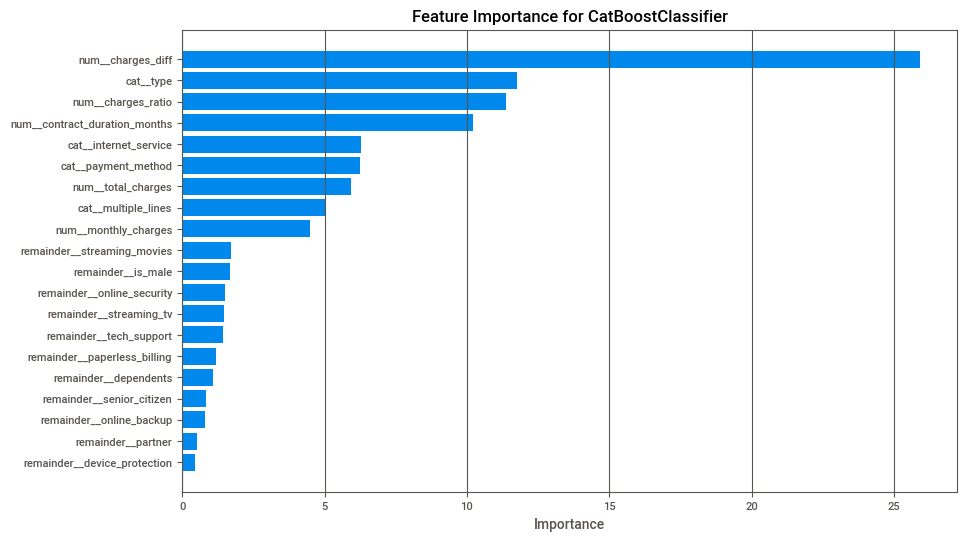

In [105]:
feature_importance = (
    optuna_search.best_estimator_.named_steps.estimator.feature_importances_
)
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align="center")
plt.yticks(
    range(len(sorted_idx)),
    np.array(
        optuna_search.best_estimator_.named_steps.transformer.get_feature_names_out()
    )[sorted_idx],
)
plt.grid(axis="x")
plt.title("Feature Importance for CatBoostClassifier")
plt.xlabel("Importance")
plt.show()

### 1.10.2. ROC кривые и матрицы ошибок


Выведем ход поиска оптимальных параметров optuna и также временные показатели (fit/predict):

In [106]:
with pd.option_context("display.max_columns", None):
    display(optuna_search.trials_dataframe())

,number,value,datetime_start,datetime_complete,duration,params_drop__features_to_drop,params_estimator__cat_features,params_estimator__iterations,params_estimator__learning_rate,params_estimator__max_depth,user_attrs_mean_fit_time,user_attrs_mean_score_time,user_attrs_mean_test_score,user_attrs_split0_test_score,user_attrs_split1_test_score,user_attrs_split2_test_score,user_attrs_split3_test_score,user_attrs_split4_test_score,user_attrs_std_fit_time,user_attrs_std_score_time,user_attrs_std_test_score,state
0,0,0.939700,2023-04-17 11:12:25.712400,2023-04-17 11:12:46.142382,0 days 00:00:20.429982,"[end_date, begin_date, customer_id, monthly_ch...","[0, 1, 2, 3]",850,0.013,7,4.047229,0.036915,0.939700,0.950247,0.943125,0.928235,0.936064,0.940828,0.095319,0.012815,0.007333,COMPLETE
1,1,0.938731,2023-04-17 11:12:46.143703,2023-04-17 11:13:07.183123,0 days 00:00:21.039420,"[end_date, begin_date, customer_id, monthly_ch...","[0, 1, 2, 3]",900,0.016,7,4.182641,0.023059,0.938731,0.951412,0.940621,0.927205,0.935171,0.939249,0.127416,0.005344,0.007876,COMPLETE
2,2,0.939210,2023-04-17 11:13:07.184068,2023-04-17 11:13:26.703579,0 days 00:00:19.519511,"[end_date, begin_date, customer_id]","[0, 1, 2, 3]",900,0.008,7,3.877754,0.024415,0.939210,0.950100,0.941790,0.928166,0.936124,0.939870,0.100981,0.008990,0.007172,COMPLETE
3,3,0.939193,2023-04-17 11:13:26.704701,2023-04-17 11:13:45.171144,0 days 00:00:18.466443,"[end_date, begin_date, customer_id]","[0, 1, 2, 3]",850,0.010,7,3.671132,0.020371,0.939193,0.950889,0.942529,0.927393,0.935401,0.939755,0.043332,0.001124,0.007770,COMPLETE
4,4,0.935938,2023-04-17 11:13:45.172059,2023-04-17 11:14:03.499233,0 days 00:00:18.327174,"[end_date, begin_date, customer_id]","[0, 1, 2, 3]",850,0.003,7,3.638860,0.024907,0.935938,0.947500,0.938956,0.924388,0.932741,0.936105,0.023384,0.009803,0.007569,COMPLETE
5,5,0.939418,2023-04-17 11:14:03.500296,2023-04-17 11:14:22.888851,0 days 00:00:19.388555,"[end_date, begin_date, customer_id, monthly_ch...","[0, 1, 2, 3]",900,0.009,7,3.853695,0.022295,0.939418,0.950389,0.942382,0.928222,0.936271,0.939829,0.070650,0.004798,0.007274,COMPLETE
6,6,0.937304,2023-04-17 11:14:22.889818,2023-04-17 11:14:38.945579,0 days 00:00:16.055761,"[end_date, begin_date, customer_id, monthly_ch...","[0, 1, 2, 3]",850,0.004,6,3.189290,0.020165,0.937304,0.948573,0.940479,0.926666,0.933413,0.937390,0.053445,0.000547,0.007285,COMPLETE
7,7,0.939541,2023-04-17 11:14:38.946548,2023-04-17 11:14:57.729961,0 days 00:00:18.783413,"[end_date, begin_date, customer_id, monthly_ch...","[0, 1, 2, 3]",850,0.014,7,3.734542,0.020400,0.939541,0.951100,0.942111,0.927720,0.936782,0.939994,0.091730,0.000536,0.007586,COMPLETE
8,8,0.939309,2023-04-17 11:14:57.731051,2023-04-17 11:15:14.835916,0 days 00:00:17.104865,"[end_date, begin_date, customer_id, monthly_ch...","[0, 1, 2, 3]",900,0.007,6,3.399034,0.020170,0.939309,0.949862,0.942684,0.929055,0.935318,0.939626,0.086464,0.000541,0.006985,COMPLETE
9,9,0.939844,2023-04-17 11:15:14.836861,2023-04-17 11:15:34.498679,0 days 00:00:19.661818,"[end_date, begin_date, customer_id]","[0, 1, 2, 3]",900,0.011,7,3.906490,0.024057,0.939844,0.951407,0.942451,0.928650,0.936543,0.940169,0.073583,0.008054,0.007441,COMPLETE


Построим ROC-кривые для всех фолдов использованной нами кросс-валидации и также для тестовых данных при обучении на полной обучающей выборке. Для этого совместим данные использованные для кросс-валидации и для тестирования в один список:

In [107]:
X_roc, y_roc = X_train.reset_index(drop=True), y_train.reset_index(drop=True)
data_for_curve = [
    [
        index,
        X_roc.loc[cv_train],
        X_roc.loc[cv_test],
        y_roc[cv_train],
        y_roc[cv_test],
    ]
    for index, [cv_train, cv_test] in enumerate(CV.split(X_roc, y_roc))
] + [
    [
        5,
        X_train,
        X_test,
        y_train,
        y_test,
    ]
]

Строим по ним график:

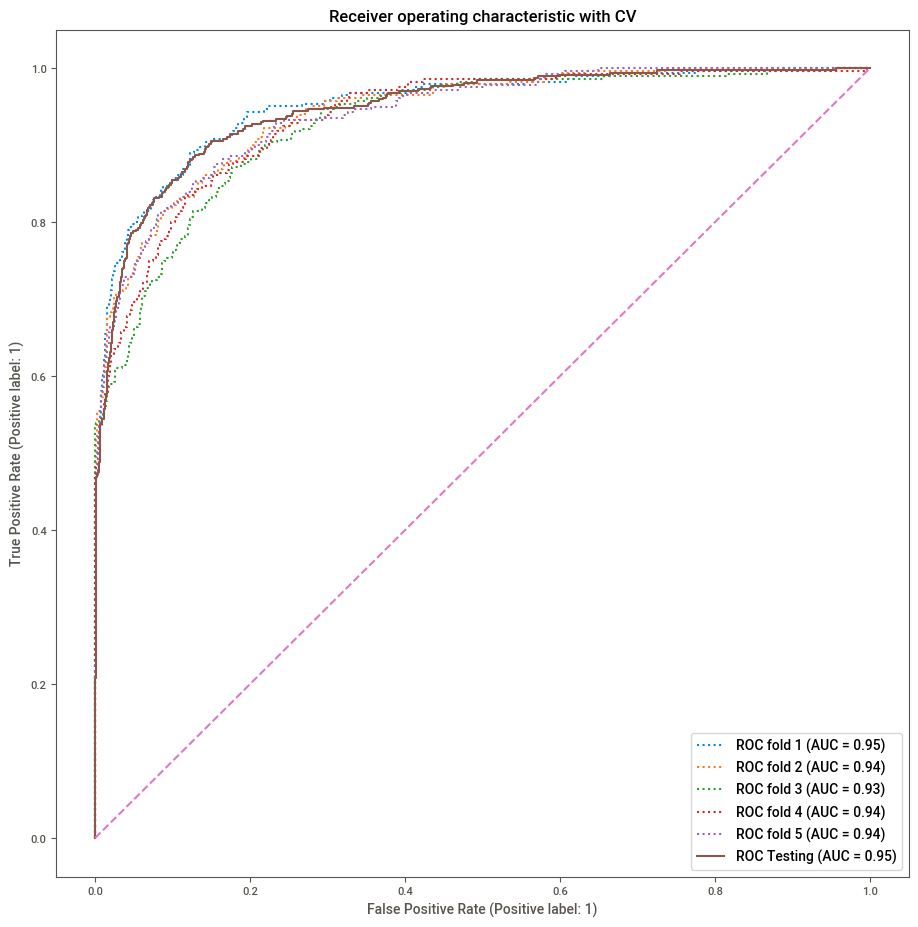

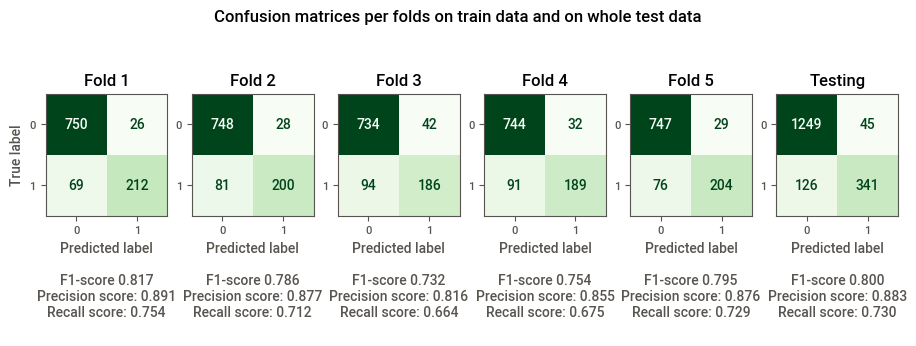

CPU times: user 2min 32s, sys: 42.2 s, total: 3min 14s
Wall time: 26.4 s


In [108]:
%%time
fig, ax = plt.subplots(figsize=(11, 11))
fig2, ax2 = plt.subplots(1, 6, figsize=(11, 3))

for index, X_train, X_test, y_train, y_test in data_for_curve:
    optuna_search.best_estimator_.fit(X_train, y_train)
    y_pred = optuna_search.best_estimator_.predict_proba(X_test)[:, 1]
    y_true = y_test
    y_pred_binary = y_pred.round()
    f1 = f1_score(y_true, y_pred_binary)
    precision = precision_score(y_true, y_pred_binary)
    recall = recall_score(y_true, y_pred_binary)

    RocCurveDisplay.from_predictions(
        y_true,
        y_pred,
        name=f"ROC fold {index+1}" if index < 5 else "ROC Testing",
        ax=ax,
        linestyle="dotted" if index < 5 else "-",
    )

    ax_sub = ConfusionMatrixDisplay.from_predictions(
        y_true,
        y_pred_binary,
        ax=ax2[index],
        # colorbar=(index == 4),
        colorbar=False,
        cmap="Greens",
    ).ax_

    ax_sub.set_title(f"Fold {index+1}" if index < 5 else "Testing")
    if index != 0:
        ax_sub.set_ylabel(None)
    ax_sub.set_xlabel(
        f"Predicted label\n\nF1-score {f1:.3f}\nPrecision score: {precision:.3f}\nRecall score: {recall:.3f}\n"
    )

ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
)
ax.set_title(
    "Receiver operating characteristic with CV",
)
fig2.suptitle(
    "Confusion matrices per folds on train data and on whole test data",
)
# plt.tight_layout()
ax.plot([0, 1], [0, 1], linestyle="--")
plt.show()

### 1.10.3. Выводы


<b>Выводы: </b>
* На всех фолдах получены схожие результаты качества предсказаний (ROC-AUC: 0.93-0.95, F1: 0.73-0.82)
    * Выделяется ROC-кривая на 1 фолде (голубая кривая), самый высокий ROC-AUC благодаря выскоой точности предсказаний(precision, меньше всего False Positive) 
* На тестовых данных ROC-кривая в отдельных местах чуть уступает кривой на лучшем фолде, что говорит нам о том, что мы достаточно удачно подобрали гиперпараметры модели
* Больше всего у модели ошибок типа False Negative, то есть клиент ушел, а мы предсказали, что он останется. Здесь нужно понимать, какой баланс нужен заказчику между False Negative и False Positive, насколько убыток от предполагаемых мер премирования пользователей (которые по предскаанию модели могут уйти) выгоднее чем возможная потеря клиента.
* В feature importances на первом месте ожидаемо charges_diff, его аналог charges_ratio на два места ниже
* Лучше всего в feature importances себя показали численные и категориальные признаки: все 9 в ТОП-9
* is_male имеет значение важности для CatBoost-а больше чем у многих гораздо более коррелирующих признаков

In [109]:
toc = time.perf_counter()
print(f"Тетрадка выполнялась ~ {round((toc - tic)/60)} минут")

Тетрадка выполнялась ~ 6 минут


# 2. Отчет


Вопросы для отчета:
1. Какие пункты плана были выполнены, а какие — нет. Почему?
2. Какие трудности возникли и как вы их преодолели?
3. Какие ключевые шаги в решении задачи вы выделили?
4. Какие признаки использовали для обучения модели и какая предобработка этих признаков была выполнена?
5. Какая ваша итоговая модель, какие у неё гиперпараметы и какое качество?

## 2.1. План
Были выполнены все пункты плана, подробности ниже:

## 2.2. Ключевые шаги


1. <b>Знакомство с задачей и данными, предварительный анализ</b>
    * <i>знакомство с ТЗ</i>
        * проанализировали его данные
        * увидели, что данные состоят из нескольких csv-файлов с ключевым полем customerID
        * увидели дату актальности данных 1 февраля 2020
    * <i>чтение данных и анализ структуры данных</i>
        * прочитали данные из 4 файлов
        * посмотрели на список полей и их типы в получившихся 4 таблицах: в основном типы object, по наполнению увидели, что можно их приводить к category / boolean/ float / datetime
    * <i>предобработка, предварительный разведочный анализ (EDA) для формулирования вопросов к заказчику</i>
        * проанализировали поле customerID и полноту данных в 4 таблицах
            * получили, что больше всего клиентов, у которых подключены услуги и телефонии и интернета , далее клиенты только с телефонией , и меньше всего клиентов с один лишь интернетом (628)
            * проанализировали их также в разбивке по целевому признаку: больше всего клиентов ушло будучи подключенными к обеим услугам (1586 против 3249 оставшихся), клиентов подключенных только к интернету ушло 170 к 512 оставшимся, а из клиентов подключенных только к телефонии ушло меньше всего - 113 к 1413
        * объединили данные в один датафрейм по полю customerID, привели названия к snake_case
        * привели типы данных к корректным:
            * begin_date, end_date - datetime
            * gender, paperless_billing, partner, dependents, online_security, online_backup, device_protection, tech_support, streaming_tv, streaming_movies, senior_citizen, multiple_lines - boolean
            * type, payment_method, internet_service - category
            * выделили отдельные признаки has_phone, has_internet
            * выделили целевой признак exited на основе признака end_date (если не пустой)
        * добавили синтетические признаки для анализа: 
            * продолжительность договора с клиентом в месяцах
            * численный признак долга/переплаты
            * месяц начала договора клиента - только для анализа
        * провели предварительное EDA с помощью библиотек sweetviz и ydata-profiling 
            * сделали выводы по взимосвязям между столбцами и целевым признаком, обнаружили достаточно высокие корреляции, увидели нисходящий тренд у monthly_charges
    * <i>обсуждение с заказчиком (или другим уполномоченным лицом) - обсудили с тимлидом</i>        
        * примерный вид результата
        * требования и этапы работы
            * метрика качества - ROC-AUC
            * тестовые данные - 25%
            * получили полное описание полей, RANDOM_STATE=130323
            * минимум 2 модели обучить (бустинг + классическая)
            * этапы:
                * Первичное знакомство / загрузка данных
                * Исследовательский анализ данных
                * Моделирование
                * Тестирование и выводы        
        * вопросов появившихся после EDA (например, вопросов по признакам, полноте данных, источнике данных и т.д.)
            * обсудили данные, end_date - только 4 месяца уникальных
            
 

           
2. <b>Исследовательский анализ данных и обработка</b>
    * <i>доработка EDA после уточнения целей</i>
        * добавили отдельную heatmap-матрицу корреляций Phik (работает для всех типов признаков)
        * добавили pairplot (для анализа взаимосвязей между числовыми столбцамии), где увидели практически четкую границу по целевому признаку для синтетического признака долга/переплаты
    * <i>feature extraction & engineering - извлечение из данных новых признаков и преобразование признаков в понятный для модели вид</i>
        * для дальнейшего использовния в pipeline из синтетических выбрали  признаки длительности контракта клиента и долга/переплаты,
    * <i>анализ и обработка пропусков, выбросов, аномалий</i>
        * обработали пропуски:
                * заполнили total_charges на основе monthly_charges и длительности контракта клиента в месяцах
                * заполнили в internet_service пропуски на "n/a" - для того, чтобы не использовать отдельный признак has_internet (Catboost обработает internet_service как категорию, для лог. регрессии - обработаем OneHotEncoder-ом)
        * Посмотрели на диаграммы размаха численных признаков, увидели выбросы на нашем синтетическом признаке долга/переплаты, которые и являлись показателями ухода, поэтому выбросы не обрабатывали
        * нашли аномалии в данных
            * для самых ранних 3 месяцев в begin_date - ушли все клиенты, но решили эти данные не удалять
    * <i>feature selection - отбор признаков для использования в модели</i>
        * провели дополнительный анализ утечки целевого признака, где заключили что наш синтетический признак долга/переплаты не является утечкой
        * для дальнейшего использовния в pipeline из синтетических выбрали  признаки длительности контракта клиента и численный признак долга/переплаты,
        * проанализировали корреляции: добавили в перебор параметров для лог. регрессии исключение monthly_charges
     

   
        
3. <b>Обучение моделей</b>
    * <i>разбиение данных (CV, 25% - тестовые, random_state=130323)</i>
        * разбили данные на тестовые (25%) и обучающие, train_test_split с random_state=130323 и stratify по целевому признаку
    * <i>построение dummy-модели как baseline для сравнения</i>
        * использовали DummyClassifier со стратегией "stratified", ожидаемо показал неудовлетворительное значение roc_auc ~ 0.5
    * <i>выбор моделей для обучения и построение для них пайплайнов (возможно, с использованием кодирования/масштабирования или других типов преобразований в зависимости от модели)</i>
        * выбрали CatBoostClassifier, LogisticRegression, RandomForestClassifier для сравнениях их качества на кросс-валидации
        * построили пайплайны
            * для feature extraction
                * извлекли признаки длительности контракта клиента и численный признак долга/переплаты
            * для обработки категориальных признаков
                * замена пропусков
                * для RandomForestClassifier - OrdinalEncoder
            * для обработки численных признаков
                * замена пропусков
                * для LogisticRegression - StandardScaler/PowerTransformer
            * объединили пайплайны для обработки категориальных/численных признаков с помощью ColumnTransformer
            * объединили для каждой модели все пайплайны в один и добавили удаление признаков с помощью трансформера DropFeatures из feature-engine и в качестве последнего шага добавили сам estimator
    * <i>кросс-валидация, подбор гиперпараметров моделей</i>
        * подбирали параметры на кросс-валидации: CV = StratifiedKFold(shuffle=True, random_state=130323)
        * использовали optuna в sklearn-стиле с помощью класса optuna.integration.OptunaSearchCV
        * направление оптимизации - maximize, метрика - roc_auc
        * было выполнено по 10 итераций перебора гиперпараметров для каждой модели
    *  <i>сравнение качества моделей</i>
        * лучше всех среди рассмотренных нами моделей c небольшим отрывом показал себя градиентный бустинг CatBoost (ROC-AUC 0.939 на CV), 
        * на втором месте - лог.регрессия (ROC-AUC 0.938 на CV), 
        * на третьем - RandomForestClassifier (0.936)

4. <b>Тестирование модели, оформление результатов</b>
    * тестирование лучшей модели
        * CatBoost показал результат на тестовых данных для ROC-AUC 0.947
    * анализ результатов тестирования, выводы
        * анализ, выводы ниже
    * подготовили результаты:
        * определили важности признаков - вывели feature importance для нашей лучшей модели 
        * построили ROC кривые для предсказаний по фолдам при кросс-валидации и по предсказаниям для тестовых данных при обучении на полных train-данных
        * построили также для всех фолдов и тестовых данных матрицы ошибок
        

## 2.3. Выводы, анализ результатов тестирования




* Итоговая модель - `CatBoostClassifier`

* <i>Для обучения модели использовались следующие признаки:</i>
    * `type`
    * `payment_method`
    * `internet_service`
    * `multiple_lines`
    * `monthly_charges`
    * `total_charges`
    * `charges_diff`
    * `charges_ratio`
    * `contract_duration_months`
    * `paperless_billing`
    * `senior_citizen`
    * `partner`
    * `dependents`
    * `online_security`
    * `online_backup`
    * `device_protection`
    * `tech_support`
    * `streaming_tv`
    * `streaming_movies`
    * `is_male`
    
* <i>В качестве предобработки признаков выполнялась</i>:

    * замена пропусков в numeric (total_charges, charges_diff, charges_ratio) на 0
    * замена пропусков в categorical/object (internet_service, multiple_lines) на "n/a"

* <i>Гиперпараметры модели</i>, полученные поиском оптимальных параметров optuna на кросс-валидации:

In [110]:
optuna_search.best_estimator_.named_steps.estimator.get_params()

{'verbose': False,
 'max_depth': 7,
 'iterations': 900,
 'learning_rate': 0.011,
 'cat_features': [0, 1, 2, 3]}

* <i>Простраство гиперпараметров на котором производился поиск:</i>

In [111]:
optuna_search.param_distributions

{'estimator__max_depth': IntDistribution(high=7, log=False, low=6, step=1),
 'estimator__iterations': IntDistribution(high=900, log=False, low=800, step=50),
 'estimator__learning_rate': FloatDistribution(high=0.02, log=False, low=0.001, step=0.001),
 'estimator__cat_features': CategoricalDistribution(choices=([0, 1, 2, 3],)),
 'drop__features_to_drop': CategoricalDistribution(choices=(['end_date', 'begin_date', 'customer_id'], ['end_date', 'begin_date', 'customer_id', 'monthly_charges']))}

* как видим, кроме параметров самого CatBoost-а (`max_depth`, `iterations`, `learning_rate`) смотрели на необходимость признака `monthly_charges`, `cat_features` здесь константный

* <i>Качество модели:</i>
    * <b>ROC_AUC: 0.95</b>
    * F1: 0.8
* При кросс-валидации на всех фолдах получены схожие результаты качества предсказаний (ROC-AUC: 0.93-0.95, F1: 0.73-0.82)
    * Выделяется ROC-кривая на 1 фолде (голубая кривая), самый высокий ROC-AUC благодаря высокой точности предсказаний(precision, меньше всего False Positive) 
    * сильно проседает 3-ий фолд из-за самых низких результатов и по полноте и по точности
* На тестовых данных <i>ROC-кривая</i> в отдельных местах чуть уступает кривой на лучшем фолде, что говорит нам о том, что мы достаточно удачно подобрали гиперпараметры модели, и возможно еще из-за того, что было больше данных для обучения модели(чем при кросс-валидации, хотя и тестовых данных тут больше)
* Таким образом, на тестовой выборке CatBoost показал результаты лучше, чем средние по кросс-валидации
* <i>В feature importances:</i>
    * на первом месте ожидаемо charges_diff, его аналог charges_ratio на два места ниже
    * Лучше всего в feature importances себя показали численные и категориальные признаки: все 9 в ТОП-9
    * интересно, что is_male имеет значение важности для CatBoost-а больше чем у многих гораздо более коррелирующих с целевым признаков
* Больше всего у модели ошибок типа False Negative, то есть клиент ушел, а мы предсказали, что он останется. Здесь нужно понимать, какой баланс нужен заказчику между False Negative и False Positive, насколько убыток от предполагаемых мер премирования пользователей (которые по предскаанию модели могут уйти) выгоднее чем возможная потеря клиента.
* Таким образом задача была решена с достаточно высоким значением качества, дальнейшая донастройка и внедрение модели возможно после общения с заказчиком.